# Air Pollution
What is it?

Air pollution refers to the release of pollutants into the air that are detrimental to human health and the planet as a whole. It can be described as one of the most dangerous threats that the humanity ever faced. It causes damage to animals, crops, forests, and wate-bodiesr. It also contributes to the depletion of the ozone layer, which protects the Earth from the sun's UV rays. Some of the other environmental effects of air pollution are haze, eutrophication, and global climate changes.



#                                       EDA


#   1. Importing Librarires

# Importing Data Set "Global Air Pollution"

In [1]:

import pandas as pd
import xgboost as xgb
from xgboost import XGBClassifier
import geopandas as gpd
import matplotlib.pyplot as plt 
import warnings
import scipy 
import numpy as np
import mlxtend
from scipy.stats import norm

import seaborn as sns
warnings.filterwarnings('ignore')

import plotly.express as px
from sklearn.svm import LinearSVC
from mlxtend.plotting import plot_decision_regions
from matplotlib.colors import ListedColormap
#from matplotlib import Patch
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from scipy import stats
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import model_selection
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression

### importing lazypredict library
import lazypredict

### importing LazyClassifier for classification problem because here we are solving Classification use case.
#from lazypredict.Supervised import LazyClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score

from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeClassifier

# geographical data using plotly
  
# importing all necessary libraries
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, \
f1_score, roc_auc_score, roc_curve, precision_score, recall_score
import plotly.graph_objs as go

from chart_studio import plotly  as py
# some more libraries to plot graph
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
  
# To establish connection
init_notebook_mode(connected = True)

  

In [2]:

df =pd.read_csv("global air pollution dataset.csv")
print(df)
latlong =pd.read_csv("world_latitude_longitude.csv")


                        Country              City  AQI Value AQI Category  \
0            Russian Federation        Praskoveya         51     Moderate   
1                        Brazil  Presidente Dutra         41         Good   
2                         Italy   Priolo Gargallo         66     Moderate   
3                        Poland         Przasnysz         34         Good   
4                        France          Punaauia         22         Good   
...                         ...               ...        ...          ...   
23458                     India      Gursahaiganj        184    Unhealthy   
23459                    France            Sceaux         50         Good   
23460                     India          Mormugao         50         Good   
23461  United States of America       Westerville         71     Moderate   
23462                  Malaysia            Marang         70     Moderate   

       CO AQI Value CO AQI Category  Ozone AQI Value Ozone AQI Category  \


##### Displaying top 10 records

In [10]:
df.head(10)

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good
2,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate
3,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good
4,France,Punaauia,22,Good,0,Good,22,Good,0,Good,6,Good
5,United States of America,Punta Gorda,54,Moderate,1,Good,14,Good,11,Good,54,Moderate
6,Germany,Puttlingen,62,Moderate,1,Good,35,Good,3,Good,62,Moderate
7,Belgium,Puurs,64,Moderate,1,Good,29,Good,7,Good,64,Moderate
8,Russian Federation,Pyatigorsk,54,Moderate,1,Good,41,Good,1,Good,54,Moderate
9,Egypt,Qalyub,142,Unhealthy for Sensitive Groups,3,Good,89,Moderate,9,Good,142,Unhealthy for Sensitive Groups


##### Displaying last 10 records

In [11]:
df.tail(10)

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category
23453,United Kingdom of Great Britain and Northern I...,Urmston,33,Good,1,Good,30,Good,3,Good,33,Good
23454,India,Konnur,86,Moderate,0,Good,23,Good,0,Good,86,Moderate
23455,China,Shaoguan,160,Unhealthy,3,Good,160,Unhealthy,1,Good,79,Moderate
23456,United States of America,Highland Springs,54,Moderate,1,Good,34,Good,5,Good,54,Moderate
23457,Slovakia,Martin,71,Moderate,1,Good,39,Good,1,Good,71,Moderate
23458,India,Gursahaiganj,184,Unhealthy,3,Good,154,Unhealthy,2,Good,184,Unhealthy
23459,France,Sceaux,50,Good,1,Good,20,Good,5,Good,50,Good
23460,India,Mormugao,50,Good,1,Good,22,Good,1,Good,50,Good
23461,United States of America,Westerville,71,Moderate,1,Good,44,Good,2,Good,71,Moderate
23462,Malaysia,Marang,70,Moderate,1,Good,38,Good,0,Good,70,Moderate


##### Checking total number of entries , columns and data types

In [12]:
df.info()
print("No of rows and columns are : ",df.shape,df.size)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23463 entries, 0 to 23462
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Country             23036 non-null  object
 1   City                23462 non-null  object
 2   AQI Value           23463 non-null  int64 
 3   AQI Category        23463 non-null  object
 4   CO AQI Value        23463 non-null  int64 
 5   CO AQI Category     23463 non-null  object
 6   Ozone AQI Value     23463 non-null  int64 
 7   Ozone AQI Category  23463 non-null  object
 8   NO2 AQI Value       23463 non-null  int64 
 9   NO2 AQI Category    23463 non-null  object
 10  PM2.5 AQI Value     23463 non-null  int64 
 11  PM2.5 AQI Category  23463 non-null  object
dtypes: int64(5), object(7)
memory usage: 2.1+ MB
No of rows and columns are :  (23463, 12) 281556


##### Finding Count,Mean,SD,Min,Max and Quantile

In [13]:
df.describe()

,AQI Value,CO AQI Value,Ozone AQI Value,NO2 AQI Value,PM2.5 AQI Value
count,23463.000000,23463.000000,23463.000000,23463.000000,23463.000000
mean,72.010868,1.368367,35.193709,3.063334,68.519755
std,56.055220,1.832064,28.098723,5.254108,54.796443
min,6.000000,0.000000,0.000000,0.000000,0.000000
25%,39.000000,1.000000,21.000000,0.000000,35.000000
50%,55.000000,1.000000,31.000000,1.000000,54.000000
75%,79.000000,1.000000,40.000000,4.000000,79.000000
max,500.000000,133.000000,235.000000,91.000000,500.000000


##### Checking Missing Values

In [14]:
df.isna().sum()



Country               427
City                    1
AQI Value               0
AQI Category            0
CO AQI Value            0
CO AQI Category         0
Ozone AQI Value         0
Ozone AQI Category      0
NO2 AQI Value           0
NO2 AQI Category        0
PM2.5 AQI Value         0
PM2.5 AQI Category      0
dtype: int64

# Filling the gaps


Missing values can be found only in Country column (about 1.82%).

Let's take a look.

In [15]:
missing_country_cities = df.loc[df.Country.isna()]['City'].unique()
print(f"We've got {len(missing_country_cities)} cities without a stated country.")
print("For Instance:")
for City in missing_country_cities[:427]:
    print(f'- {City}')
    



We've got 427 cities without a stated country.
For Instance:
- Granville
- Kingston Upon Hull
- New Waterford
- Kingstown
- Nanakuli
- Lavagna
- Ladispoli
- Dong Hoi
- Nettuno
- Puebloviejo
- Fiumicino
- Nishinomiya
- Carteret
- Ercolano
- Bolama
- Bairiki
- Broome
- Cananeia
- Cavite
- Prince Rupert
- Roseau
- Ardrossan
- Stockholm
- Tacloban
- Tadotsu
- Ternate
- Torre Del Greco
- Broadstairs
- Ermoupolis
- Parainen
- Piombino
- Pomorie
- Port Dickson
- Puerto Real
- Rottingdean
- Sakaiminato
- San Jose
- Savona
- Sines
- Oarai
- Keansburg
- Juneau
- Santa Pola
- Sawtell
- Sinop
- Kalianget
- Futtsu
- Gingoog
- Caibarien
- Caminawit
- Balikpapan
- Golcuk
- Gold Coast
- Hambantota
- Isla Mujeres
- Santa Flavia
- Crotone
- Vieste
- Moche
- Namerikawa
- Menton
- Zanzibar
- Domoni
- West Bay
- Wakkanai
- San Benedetto Del Tronto
- Sao Francisco Do Sul
- Anacortes
- Banjul
- New York
- Akcakoca
- Alcudia
- Titusville
- Togitsu
- Velsen
- Dinard
- Split
- Port De Bouc
- Pulupandan
- Pambuj

It's too deep to dive into.

For now, let's fill the gaps with 'Unknown'

In [3]:
# Check is there already an 'Unknown' country.
try:
    df.loc[df['Country' == 'Unknown']]
except KeyError:
    print('None')
    
# Fill the names
df['Country'] =df["Country"].fillna("Unknown")
print(f'Missing Values: {df["Country"].isna().sum()}')
df.isna().sum()

None
Missing Values: 0


Country               0
City                  1
AQI Value             0
AQI Category          0
CO AQI Value          0
CO AQI Category       0
Ozone AQI Value       0
Ozone AQI Category    0
NO2 AQI Value         0
NO2 AQI Category      0
PM2.5 AQI Value       0
PM2.5 AQI Category    0
dtype: int64

# Feature Engineering

In [17]:
df["Latitude"] = np.nan
df["Longitude"] = np.nan

In [18]:
for i in df.index:
    if(df["Country"][i] in latlong.country.values):
        x = latlong[latlong['country']==df["Country"][i]].index.values
        df["Latitude"][i] = latlong["latitude"][x]
        df["Longitude"][i] = latlong["longitude"][x]

# Checking for missing values of Longitutde and Latitude

In [24]:
df["Latitude"].isna().sum()

1720

In [25]:
df["Longitude"].isna().sum()

1720

#### Let's create a new column with the last not Nan Lat value

In [26]:

df['Lat_shift'] = df['Latitude'].shift()
df['Lat_shift'] = df['Lat_shift'].fillna(method='ffill')

df


,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,Latitude,Longitude,Lat_shift,Long_shift,Lat_new
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate,NaN,NaN,NaN,NaN,NaN
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-14.235004,-51.925280,NaN,NaN,NaN
2,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate,41.871940,12.567380,-14.235004,-51.925280,13.818468
3,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good,51.919438,19.145136,41.871940,12.567380,46.895689
4,France,Punaauia,22,Good,0,Good,22,Good,0,Good,6,Good,46.227638,2.213749,51.919438,19.145136,49.073538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23458,India,Gursahaiganj,184,Unhealthy,3,Good,154,Unhealthy,2,Good,184,Unhealthy,20.593684,78.962880,48.669026,19.699024,34.631355
23459,France,Sceaux,50,Good,1,Good,20,Good,5,Good,50,Good,46.227638,2.213749,20.593684,78.962880,33.410661
23460,India,Mormugao,50,Good,1,Good,22,Good,1,Good,50,Good,20.593684,78.962880,46.227638,2.213749,33.410661
23461,United States of America,Westerville,71,Moderate,1,Good,44,Good,2,Good,71,Moderate,37.090240,-95.712891,20.593684,78.962880,28.841962


In [27]:
df['Long_shift'] = df['Longitude'].shift()
df['Long_shift'] = df['Long_shift'].fillna(method='ffill')
df

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,Latitude,Longitude,Lat_shift,Long_shift,Lat_new
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate,NaN,NaN,NaN,NaN,NaN
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-14.235004,-51.925280,NaN,NaN,NaN
2,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate,41.871940,12.567380,-14.235004,-51.925280,13.818468
3,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good,51.919438,19.145136,41.871940,12.567380,46.895689
4,France,Punaauia,22,Good,0,Good,22,Good,0,Good,6,Good,46.227638,2.213749,51.919438,19.145136,49.073538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23458,India,Gursahaiganj,184,Unhealthy,3,Good,154,Unhealthy,2,Good,184,Unhealthy,20.593684,78.962880,48.669026,19.699024,34.631355
23459,France,Sceaux,50,Good,1,Good,20,Good,5,Good,50,Good,46.227638,2.213749,20.593684,78.962880,33.410661
23460,India,Mormugao,50,Good,1,Good,22,Good,1,Good,50,Good,20.593684,78.962880,46.227638,2.213749,33.410661
23461,United States of America,Westerville,71,Moderate,1,Good,44,Good,2,Good,71,Moderate,37.090240,-95.712891,20.593684,78.962880,28.841962


In [28]:
#Now we can calculate whatever metric we want:

df['Lat_new'] = df['Lat_shift'] + (df['Latitude'] - df['Lat_shift'])/2


In [29]:


df['Long_new'] = df['Long_shift'] + (df['Longitude'] - df['Long_shift'])/2

In [30]:
df.loc[pd.isnull(df['Latitude']), 'Latitude'] = df['Lat_new'].fillna(method='bfill')

In [31]:
df.pop('Lat_shift')
df.pop('Lat_new')

0              NaN
1              NaN
2        13.818468
3        46.895689
4        49.073538
           ...    
23458    34.631355
23459    33.410661
23460    33.410661
23461    28.841962
23462    20.650362
Name: Lat_new, Length: 23463, dtype: float64

In [32]:
df.loc[pd.isnull(df['Longitude']), 'Longitude'] = df['Long_new'].fillna(method='bfill')



In [33]:
df.pop('Long_shift')
df.pop('Long_new')

0              NaN
1              NaN
2       -19.678950
3        15.856258
4        10.679443
           ...    
23458    49.330952
23459    40.588314
23460    40.588315
23461    -8.375006
23462     3.131437
Name: Long_new, Length: 23463, dtype: float64

In [34]:
df

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,Latitude,Longitude
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate,13.818468,-19.678950
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-14.235004,-51.925280
2,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate,41.871940,12.567380
3,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good,51.919438,19.145136
4,France,Punaauia,22,Good,0,Good,22,Good,0,Good,6,Good,46.227638,2.213749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23458,India,Gursahaiganj,184,Unhealthy,3,Good,154,Unhealthy,2,Good,184,Unhealthy,20.593684,78.962880
23459,France,Sceaux,50,Good,1,Good,20,Good,5,Good,50,Good,46.227638,2.213749
23460,India,Mormugao,50,Good,1,Good,22,Good,1,Good,50,Good,20.593684,78.962880
23461,United States of America,Westerville,71,Moderate,1,Good,44,Good,2,Good,71,Moderate,37.090240,-95.712891




When it comes to some non-alphabetic characters: spaces can lead to an error (for instance, during data aggregation - and we'll be having plenty of that).

As for capitalised words, for someone (for me, for example), it's more convenient to type without bothering about upper case letters.

However, it's always a compromise: upper case can be quite useful to distinguish abbreviations in the column name.

In [8]:
df.columns = (
 df
 .columns
 .str.replace(" ",'_', regex=False)
  .str.replace(" ",'_', regex=False)
)

df.columns

Index(['Country', 'City', 'AQI_Value', 'AQI_Category', 'CO_AQI_Value',
       'CO_AQI_Category', 'Ozone_AQI_Value', 'Ozone_AQI_Category',
       'NO2_AQI_Value', 'NO2_AQI_Category', 'PM2.5_AQI_Value',
       'PM2.5_AQI_Category'],
      dtype='object')

# Most represented countries

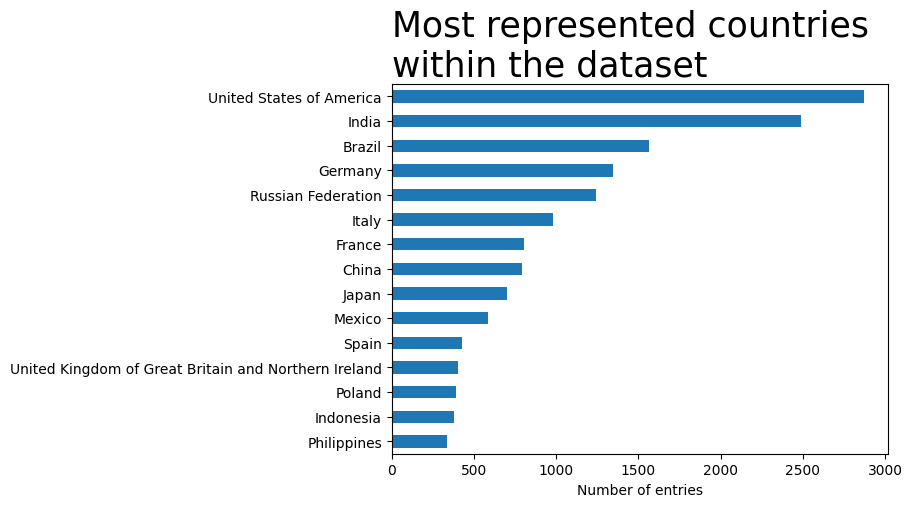

In [5]:
df.groupby("Country")["PM2.5_AQI_Category"].count().sort_values(ascending=False).head(15).sort_values(ascending=True).plot(kind='barh')
plt.title('Most represented countries\nwithin the dataset', loc='left', fontsize=25)
plt.ylabel('')
plt.xlabel('Number of entries')
plt.show()

In [92]:
import pandas_profiling
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Unknown country, which is thought to correspond to less than 2%, is listed in the top 15 represented entities.

Let's drop these entries: working primarily on a country level, we will not be able to use them.

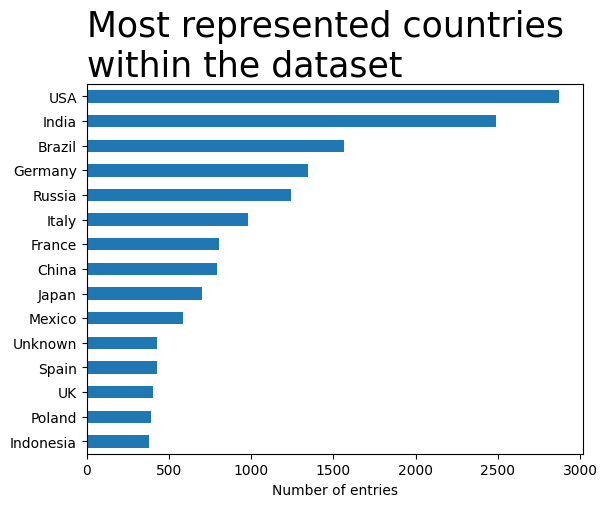

In [9]:
for pair in [
    ['Republic of North Macedonia', 'North Macedonia'],
    ['Iran (Islamic Republic of)', 'Iran'],
    ['Bolivia (Plurinational State of)', 'Bolivia'],
    ['Venezuela (Bolivarian Republic of)', 'Venezuela'],
    ['United Arab Emirates', 'UAE'],
    ['Syrian Arab Republic', 'Syria'],
    ['Russian Federation', 'Russia'],
    ['United Kingdom of Great Britain and Northern Ireland', 'UK'],
    ['United States of America', 'USA'],
    ['State of Palestine', 'Palestine'],
    ['Central African Republic', 'CAR'],
    ['Republic of Korea', 'South Korea'],
    ['Democratic Republic of the Congo', 'DRC'],
    ['Laos', "Lao People's Democratic Republic"],
    ['Kingdom of Eswatini', 'Eswatini'],
    ['United Republic of Tanzania', 'Tanzania']
]:
    
    # regex=False to avoid a red warning
    df['Country'] = df['Country'].replace(pair[0], pair[1], regex=False) 
df.groupby("Country")["PM2.5_AQI_Category"].count().sort_values(ascending=False).head(15).sort_values(ascending=True).plot(kind='barh')
plt.title('Most represented countries\nwithin the dataset', loc='left', fontsize=25)
plt.ylabel('')
plt.xlabel('Number of entries')
plt.show()
    


##### Uniques values

In [15]:
df.nunique()

Country                 176
City                  23462
AQI_Value               347
AQI_Category              6
CO_AQI_Value             34
CO_AQI_Category           3
Ozone_AQI_Value         213
Ozone_AQI_Category        5
NO2_AQI_Value            59
NO2_AQI_Category          2
PM2.5_AQI_Value         383
PM2.5_AQI_Category        6
dtype: int64

In [16]:
df["PM2.5_AQI_Category"].value_counts()

Good                              10208
Moderate                           9075
Unhealthy                          2129
Unhealthy for Sensitive Groups     1624
Very Unhealthy                      255
Hazardous                           172
Name: PM2.5_AQI_Category, dtype: int64

In [20]:
df["CO_AQI_Category"].value_counts()

Good                              23460
Moderate                              2
Unhealthy for Sensitive Groups        1
Name: CO_AQI_Category, dtype: int64

In [21]:
df["Ozone_AQI_Category"].value_counts()

Good                              21069
Moderate                           1445
Unhealthy for Sensitive Groups      491
Unhealthy                           405
Very Unhealthy                       53
Name: Ozone_AQI_Category, dtype: int64

In [22]:
df["AQI_Category"].value_counts()

Good                              9936
Moderate                          9231
Unhealthy                         2227
Unhealthy for Sensitive Groups    1591
Very Unhealthy                     287
Hazardous                          191
Name: AQI_Category, dtype: int64

In [23]:
df["NO2_AQI_Category"].value_counts()

Good        23448
Moderate       15
Name: NO2_AQI_Category, dtype: int64

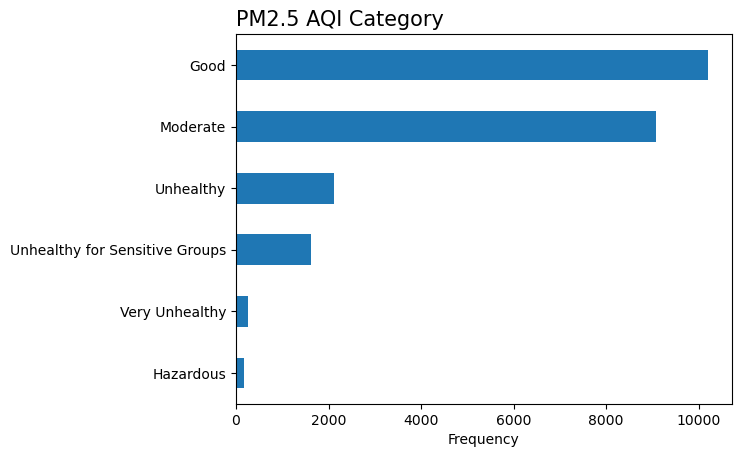

In [108]:
df['PM2.5_AQI_Category'] = df['PM2.5_AQI_Category'].replace(pair[0], pair[1], regex=False) 
df.groupby("PM2.5_AQI_Category")["PM2.5_AQI_Value"].count().sort_values(ascending=False).head(10).sort_values(ascending=True).plot(kind='barh')
plt.title('PM2.5 AQI Category', loc='left', fontsize=15)
plt.ylabel('')
plt.xlabel('Frequency')
plt.show()
    

In [24]:

        
def numeric_cols_hist(df, width, height):
    '''
    Plot histograms for all columns with numeric values.
    
    Args:
        data (DataFrame): The DataFrame to work with.
        width (int): The width of the resulting tile-looking visualisation.
        height (int): The width of the resulting tile-looking visualisation.
    
    Returns:
        Nothing.
        
    '''
    cols = df.select_dtypes(include=('number')).columns.to_list()
    df[cols].hist(bins=30, figsize=(width, height))
    plt.show()
    print('Here, the density of values in each numeric column is shown.')


def make_df_dtype(df):
    '''
    Makes a dataframe to overview data of the original dataframe, column by column.
    Each resulting row provides info dealing with each column:
    - data type
    - data specimen
    - number of unique values
    - share of missing values
    
    Args:
        data (DataFrame): The DataFrame to work with.
        
    Returns:
        resulting DataFrame        
    '''
    
    cols, dtype_col, specimens, nunique, null_share = [], [], [], [], []
    for column in df:
        cols.append(column)
        
        this_dtype = df[column].dtype
        dtype_col.append(this_dtype)
        
        specimen = df.loc[df[column].first_valid_index(), column]
        specimens.append(specimen)
        
        nunique.append(data[column].nunique())
        
        null_sum = df[column].isna().sum()
        null_to_len = null_sum / len(df[column])
        null_share.append(f'{null_to_len:.2%}')
        
    df6 = pd.DataFrame(list(zip(dtype_col,
                               specimens,
                               nunique,
                              null_share)),
                      index=cols)    
    df6.columns=['dtype',
                'specimen',
                'nunique',
               'null_share']
 
    return df
def make_heatmap_cities_per_countries_and_categories(
    list_of_countries,
    category_column,
    ylabel,
    xlabel,
    plttitle,
    palette
):
    '''
    Make heatmap based on the crosstab:
        1) create a df with selected countries only
        2) make a crosstab there:
            index = df.country (i.e. list of countries)
            columns = df.category (i.e. unique categories)
            values = df.city
            aggfunc = count
        3) visualise it as a heatmap (with all of the extra details).
    
    Args:
        list_of_countries_lst (list): list of countries to work with.
        category_column_str (str):
            pollutant categorical column ('aqi_category').
        ylabel_str (str):
            country list descriprion for Y axis label,
            for instance: 'top 10 well-represented countries\nwithin the dataset\n'
        xlabel_str (str): pollutant for X axis label ('\nair quality index (AQI)\n').
        plttitle_str (str): visualisation title.
        palette (str): colourmap ('viridis' etc.)
    
    Returns:
        Nothing.
    
    '''
    # Make a dataframe with countries selected.
    df6 = df.query('Country in @list_of_countries')
    
    
    # Enumerate categories to bring some order into visualisations.
    # Work with this temporary dataset, the original one is unchanged.
    
    # str_cols_list is created in the beginning of the project
    # (non-numeric colums excluding cities and countries).
    for column in str_cols_list:
        i = 0
        for item in ['Good', 'Moderate', 'Unhealthy for Sensitive Groups',
                     'Unhealthy', 'Very Unhealthy', 'Hazardous']:
            i+=1
            df6.loc[df6[column] == item, column] = f'{i}. {item}'
    
    
    fig, ax = plt.subplots()
    
    # The heatmap is based on this crosstab.
    this_crosstab = pd.crosstab(
        # Count the cities per each country and category.
        index=df6.Country,
        columns=df6[category_column],
        values=df6['City'],
        aggfunc='count',

        # Normalize by dividing all values by the sum of values
        # (over each column).
        normalize='index'
    )
    
    
    # Make a heatmap.
    sns.heatmap(
        this_crosstab
        # Sort values of the crosstab by the first column.
        .sort_values(by='1. Good', ascending=False),

        # Start of the heatmap's code.
        # Palette.
        cmap=palette,
        # Annotations.
        annot=True,
        fmt='.2%',
        # Edges.
        linecolor='#959595',
        linewidths=.75,
        # Colorbar is redundant.
        cbar=False
    )

    # Y
    plt.ylabel(ylabel)

    # X
    plt.xlabel(xlabel)
    plt.xticks(ticks = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5],
               labels=['Good', 'Moderate', 'Unhealthy\nfor Sensitive\nGroups',
                     'Unhealthy', 'Very\nUnhealthy', 'Hazardous'],
              rotation=360,
               ha='center')

    # Title.
    ax.set_title(plttitle,
              fontsize=25,
              loc='left')
    
    # Describe how to show nans.
    ax.patch.set(hatch='xx', edgecolor='lightgrey')
    
    # Show visualisation.
    plt.show()
    
    # This code meant to print extra comment if there are any nans.
    # Doesn't work for now.
    # if this_crosstab.isna().values.any() > 0:
        # print('    Lightgrey: no entries listed.\n')

    
    
# We will use this list of lists very often.
# Three 'courses' per turn, or 'option'.
# option[0] will be used for columns,
# option[1] - for titles/labels and so on,
# option[2] - extended comment.
column_description = [
    ['aqi', 'air quality index (AQI)', 'Air quality index (AQI): shows how polluted the air currently is\nor how polluted it is forecast to become.'],
    ['co_aqi', 'carbon monoxide (CO)', 'Carbon Monoxide is a colorless and odorless gas.\nOutdoor, it is emitted in the air above all by cars,\ntrucks and other vehicles or machineries that burn fossil fuels.'],
    ['ozone_aqi', 'ozone (O3)', 'Ground level ozone can provoke several health problems like chest pain,\ncoughing, throat irritation and airway inflammation.'],
    ['no2_aqi', 'nitrogen dioxide (NO2)', 'At the surface level, NO2 forms from cars, trucks and buses emissions,\npower plants and off-road equipment.\nExposures may contribute to develoment of asthma and respiratory infections.'],
    ['pm2_5_aqi', 'atmospheric particulate matter (PM2.5)', 'Atmospheric Particulate Matter, also known as atmospheric aerosol particles,\nare complex mixtures of small solid and liquid matter that get into the air.\nIf inhaled they can cause serious heart and lungs problem.']
              ]

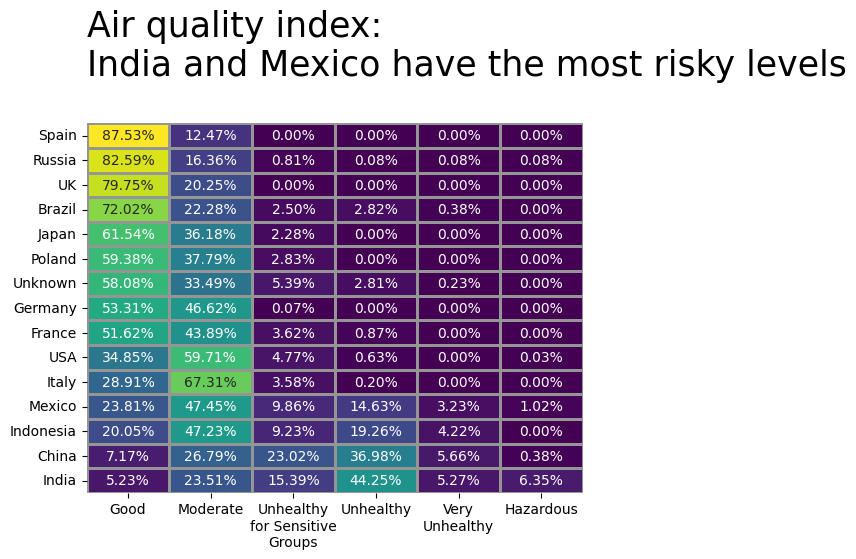

In [98]:
# Make a list of countries.
top_list = (df.groupby('Country')
               # Count the rows: any column without missing values
               ['AQI_Category'].count()
               # Sort values.
               .sort_values(ascending=False)
               .head(15)
               .index
               .to_list())


# See function defined in the beginning of this notebook.
make_heatmap_cities_per_countries_and_categories(
    list_of_countries=top_list,
    category_column='AQI_Category',
    ylabel='',
    xlabel='',
    plttitle="Air quality index:\nIndia and Mexico have the most risky levels\n",
    palette='viridis'
)

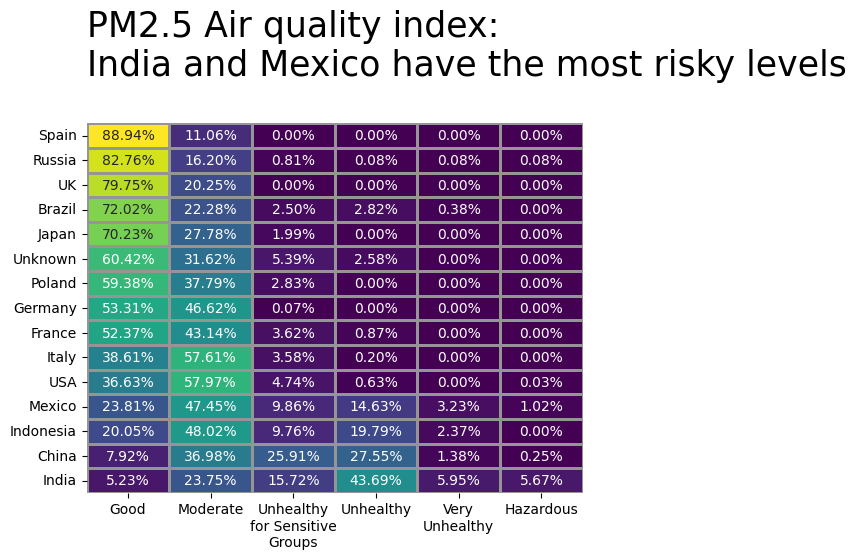

In [92]:
# Make a list of countries.
top_list = (df.groupby('Country')
               # Count the rows: any column without missing values
               ['PM2.5_AQI_Category'].count()
               # Sort values.
               .sort_values(ascending=False)
               .head(15)
               .index
               .to_list())


# See function defined in the beginning of this notebook.
make_heatmap_cities_per_countries_and_categories(
    list_of_countries=top_list,
    category_column='PM2.5_AQI_Category',
    ylabel='',
    xlabel='',
    plttitle="PM2.5 Air quality index:\nIndia and Mexico have the most risky levels\n",
    palette='viridis'
)

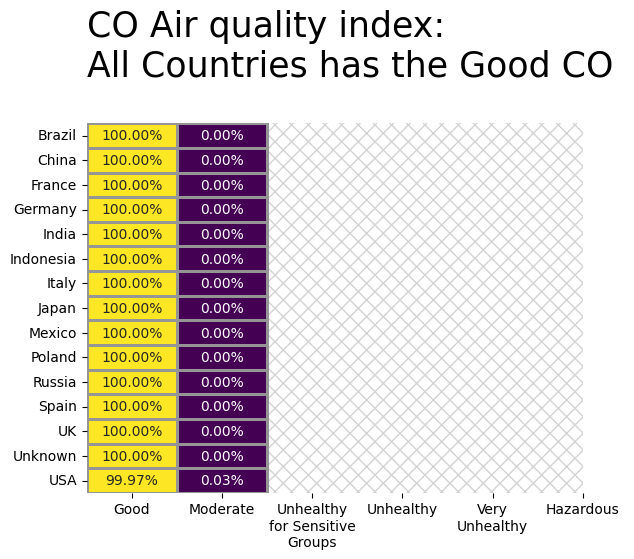

In [94]:
# Make a list of countries.
top_list = (df.groupby('Country')
               # Count the rows: any column without missing values
               ['CO_AQI_Category'].count()
               # Sort values.
               .sort_values(ascending=False)
               .head(15)
               .index
               .to_list())


# See function defined in the beginning of this notebook.
make_heatmap_cities_per_countries_and_categories(
    list_of_countries=top_list,
    category_column='CO_AQI_Category',
    ylabel='',
    xlabel='',
    plttitle="CO Air quality index:\nAll Countries has the Good CO \n",
    palette='viridis'
)

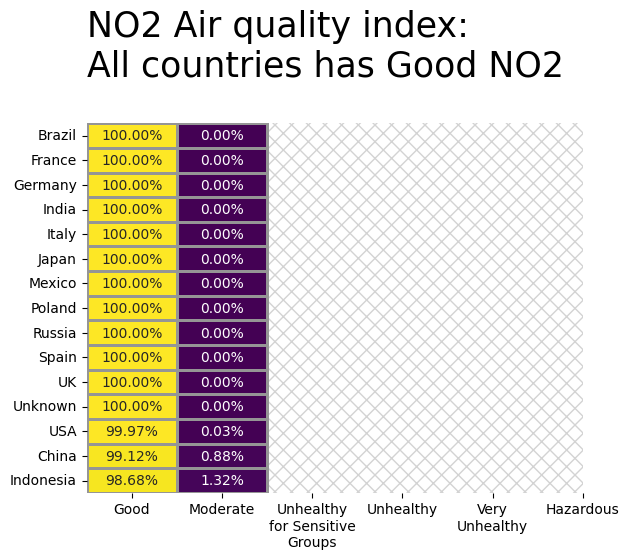

In [97]:
# Make a list of countries.
top_list = (df.groupby('Country')
               # Count the rows: any column without missing values
               ['NO2_AQI_Category'].count()
               # Sort values.
               .sort_values(ascending=False)
               .head(15)
               .index
               .to_list())


# See function defined in the beginning of this notebook.
make_heatmap_cities_per_countries_and_categories(
    list_of_countries=top_list,
    category_column='NO2_AQI_Category',
    ylabel='',
    xlabel='',
    plttitle="NO2 Air quality index:\nAll countries has Good NO2\n",
    palette='viridis'
)

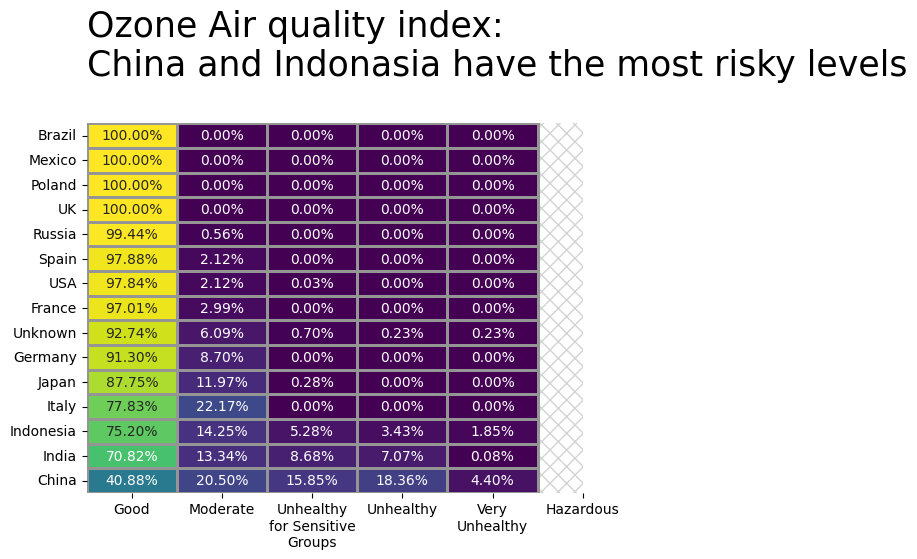

In [100]:
# Make a list of countries.
top_list = (df.groupby('Country')
               # Count the rows: any column without missing values
               ['Ozone_AQI_Category'].count()
               # Sort values.
               .sort_values(ascending=False)
               .head(15)
               .index
               .to_list())


# See function defined in the beginning of this notebook.
make_heatmap_cities_per_countries_and_categories(
    list_of_countries=top_list,
    category_column='Ozone_AQI_Category',
    ylabel='',
    xlabel='',
    plttitle="Ozone Air quality index:\nChina and Indonasia have the most risky levels\n",
    palette='viridis'
)

In [26]:
# Make a dictionary to store the columns' groups.
data_dict = dict()
data = df.copy()
# Divide columns into numeric and non-numeric ones.
num_cols_list = data.select_dtypes(include='number').columns.to_list()
str_cols_list = data.select_dtypes(include='object').columns.to_list()

# Remove cities and countries from the list: they will be used differently.
str_cols_list.remove('Country')
str_cols_list.remove('City')

# Save lists into the dictionary.
data_dict['str_cols_list'] = str_cols_list
data_dict['num_cols_list'] = num_cols_list

# Check the result.
print('Non-numeric values:')
display(data_dict['str_cols_list'])
print('\nNumeric values:')
display(data_dict['num_cols_list'])

Non-numeric values:


['AQI_Category',
 'CO_AQI_Category',
 'Ozone_AQI_Category',
 'NO2_AQI_Category',
 'PM2.5_AQI_Category']


Numeric values:


['AQI_Value',
 'CO_AQI_Value',
 'Ozone_AQI_Value',
 'NO2_AQI_Value',
 'PM2.5_AQI_Value',
 'Latitude',
 'Longitude']

In [27]:
for column in num_cols_list: 
    print(f"{column}=('{column}', 'median'),")
    
# Print code for futher aggregation.
for column in str_cols_list: 
    print(f"{column}=('{column}', pd.Series.mode),")

AQI_Value=('AQI_Value', 'median'),
CO_AQI_Value=('CO_AQI_Value', 'median'),
Ozone_AQI_Value=('Ozone_AQI_Value', 'median'),
NO2_AQI_Value=('NO2_AQI_Value', 'median'),
PM2.5_AQI_Value=('PM2.5_AQI_Value', 'median'),
Latitude=('Latitude', 'median'),
Longitude=('Longitude', 'median'),
AQI_Category=('AQI_Category', pd.Series.mode),
CO_AQI_Category=('CO_AQI_Category', pd.Series.mode),
Ozone_AQI_Category=('Ozone_AQI_Category', pd.Series.mode),
NO2_AQI_Category=('NO2_AQI_Category', pd.Series.mode),
PM2.5_AQI_Category=('PM2.5_AQI_Category', pd.Series.mode),


In [28]:
countries_cities = (
    df.groupby(['Country', 'City'])
    .agg(
        # Preprinted code.
        aqi_value=('AQI_Value', 'median'),
        co_aqi_value=('CO_AQI_Value', 'median'),
        ozone_aqi_value=('Ozone_AQI_Value', 'median'),
        no2_aqi_value=('NO2_AQI_Value', 'median'),
        pm2_5_aqi_value=('PM2.5_AQI_Value', 'median'),
        # Another set of preprinted code.
        aqi_category=('AQI_Category', pd.Series.mode),
        co_aqi_category=('CO_AQI_Category', pd.Series.mode),
        ozone_aqi_category=('Ozone_AQI_Category', pd.Series.mode),
        no2_aqi_category=('NO2_AQI_Category', pd.Series.mode),
        pm2_5_aqi_category=('PM2.5_AQI_Category', pd.Series.mode),
    )
)

countries_cities.head(20)

aqi_value  co_aqi_value  ozone_aqi_value  \
Country     City                                                     
Afghanistan Acin              62.00          0.00            46.00   
            Anar Darreh      126.00          1.00            42.00   
            Andarab          104.00          0.00            34.00   
            Asadabad         131.00          1.00            43.00   
            Asmar            151.00          2.00            48.00   
            Aybak             74.00          1.00            41.00   
            Azrow             72.00          0.00            48.00   
            Baglan            72.00          1.00            44.00   
            Bagrami          102.00          1.00            40.00   
            Baraki Barak      67.00          0.00            41.00   
            Cah Ab           123.00          1.00            47.00   
            Carikar           67.00          0.00            37.00   
            Ciras             90.00          0.00            26.00   
            Dawlatabad        92.00          1.00            43.00   
            Deh Rawud         49.00          0.00            49.00   
            Eskasem           85.00          0.00            14.00   
            Farah            103.00          1.00            42.00   
            Gardez            82.00          0.00            40.00   
            Gazni             83.00          0.00            40.00   
            Geresk           106.00          1.00            39.00   

                          no2_aqi_value  pm2_5_aqi_value  \
Country     City                                           
Afghanistan Acin                   0.00            62.00   
            Anar Darreh            0.00           126.00   
            Andarab                0.00           104.00   
            Asadabad               0.00           131.00   
            Asmar                  1.00           151.00   
            Aybak                  0.00            74.00   
            Azrow                  0.00            72.00   
            Baglan                 0.00            72.00   
            Bagrami                0.00           102.00   
            Baraki Barak           0.00            67.00   
            Cah Ab                 0.00           123.00   
            Carikar                0.00            67.00   
            Ciras                  0.00            90.00   
            Dawlatabad             0.00            92.00   
            Deh Rawud              0.00            47.00   
            Eskasem                0.00            85.00   
            Farah                  0.00           103.00   
            Gardez                 0.00            82.00   
            Gazni                  0.00            83.00   
            Geresk                 0.00           106.00   

                                            aqi_category co_aqi_category  \
Country     City                                                           
Afghanistan Acin                                Moderate            Good   
            Anar Darreh   Unhealthy for Sensitive Groups            Good   
            Andarab       Unhealthy for Sensitive Groups            Good   
            Asadabad      Unhealthy for Sensitive Groups            Good   
            Asmar                              Unhealthy            Good   
            Aybak                               Moderate            Good   
            Azrow                               Moderate            Good   
            Baglan                              Moderate            Good   
            Bagrami       Unhealthy for Sensitive Groups            Good   
            Baraki Barak                        Moderate            Good   
            Cah Ab        Unhealthy for Sensitive Groups            Good   
            Carikar                             Moderate            Good   
            Ciras                               Moderate            Good   
            Dawlatabad  

In [89]:
from pandas_visual_analysis import VisualAnalysis
VisualAnalysis(df)

172


<AxesSubplot:xlabel='Country', ylabel='PM2.5_AQI_Value'>

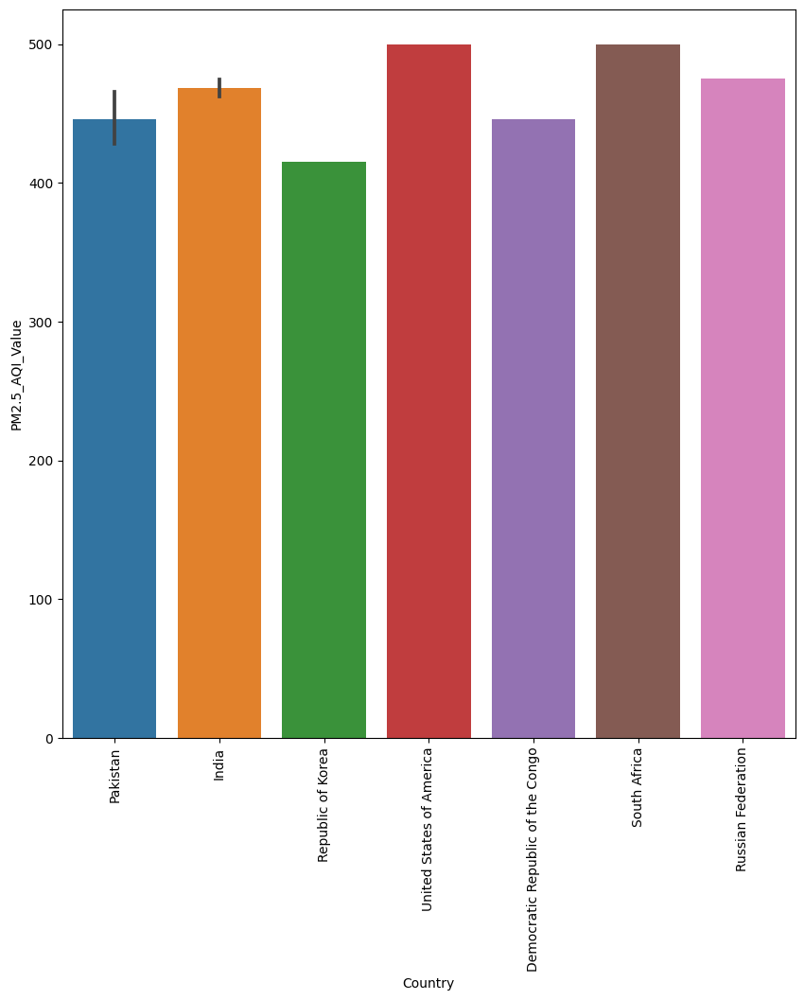

In [128]:
df_filtered = df[df['PM2.5_AQI_Category'] =='Hazardous']
cities = df_filtered['City']
d =cities.count()
print(d)

df_filtered = df[df['PM2.5_AQI_Value'] >= 400]
Country = df_filtered['Country']
plt.figure(figsize=(10, 10))
plt.xticks(rotation=90)
sns.barplot(x=Country,y='PM2.5_AQI_Value',data=df)

<AxesSubplot:xlabel='City', ylabel='PM2.5_AQI_Value'>

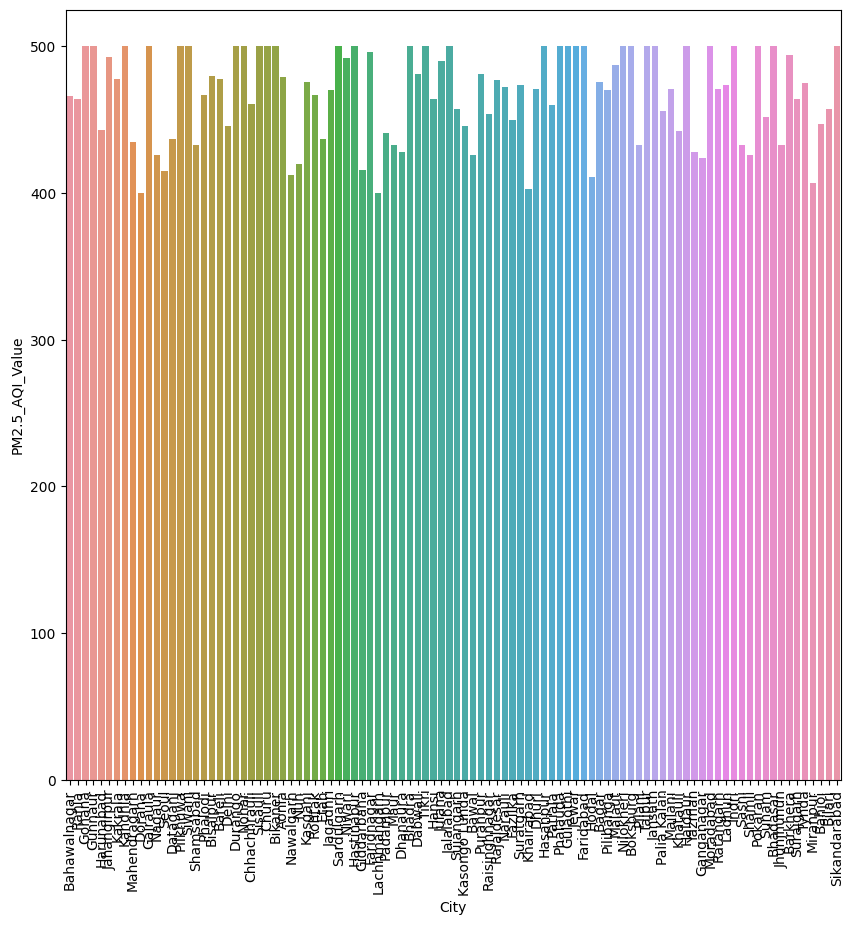

In [7]:
country_data = df[df['Country'] == 'Pakistan']
df_filtered = df[df['PM2.5_AQI_Value'] >= 400]
Country = df_filtered['City']
plt.figure(figsize=(10, 10))
plt.xticks(rotation=90)
sns.barplot(x=Country,y='PM2.5_AQI_Value',data=df)

In [8]:
# Divide columns into numeric and non-numeric ones.
num_cols = df.select_dtypes(include = 'number').columns.to_list()
str_cols = df.select_dtypes(include ='object').columns.to_list()

#### Checking values in depth: numeric

#### There are multiple pieces of data in same cities.




#### Displot by features

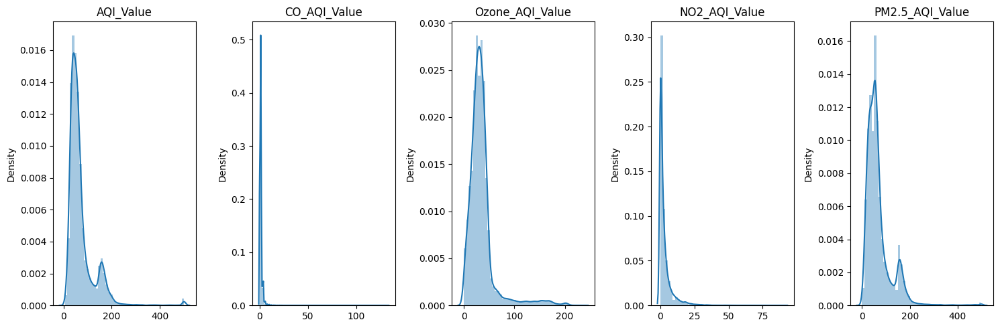

In [18]:
col=[ 'AQI_Value', 'CO_AQI_Value',
       'Ozone_AQI_Value','NO2_AQI_Value', 'PM2.5_AQI_Value']
fig = plt.figure(figsize=(15,5))

for i in range(len(col)):
    plt.subplot(1,5,i+1)
    plt.title(col[i])
    sns.distplot(df,x=df[col[i]])
plt.tight_layout()
plt.show()

####  Boxplot by features and categories

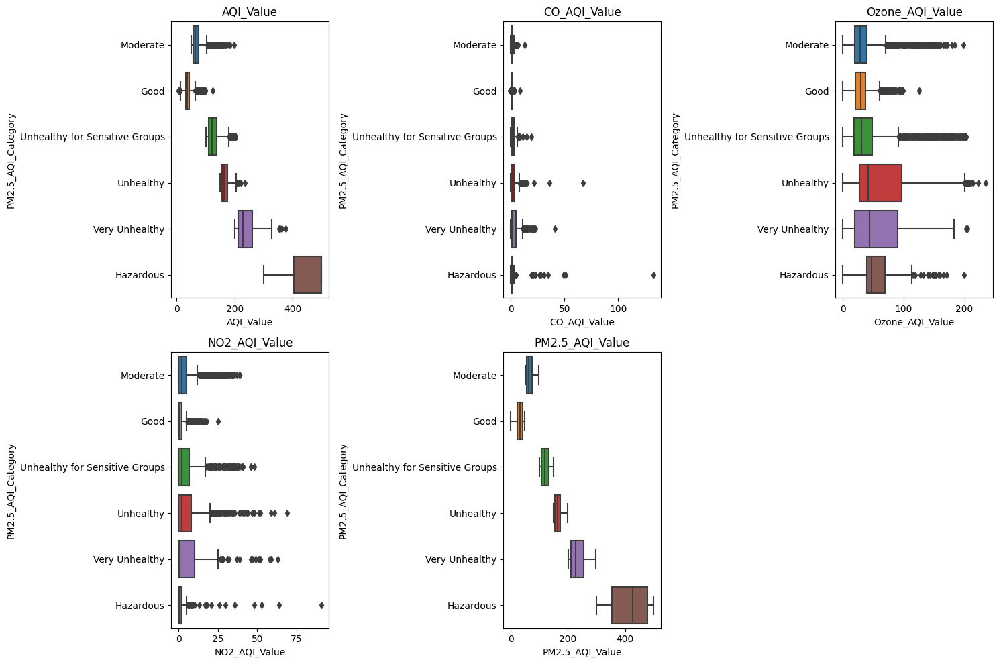

In [19]:
fig = plt.figure(figsize=(15,10))

for i in range(len(col)):
    plt.subplot(2,3,i+1)
    plt.title(col[i])
    sns.boxplot(data=df,x=df[col[i]],y=df['PM2.5_AQI_Category'])
plt.tight_layout()
plt.show()

In [ ]:
### Box plot

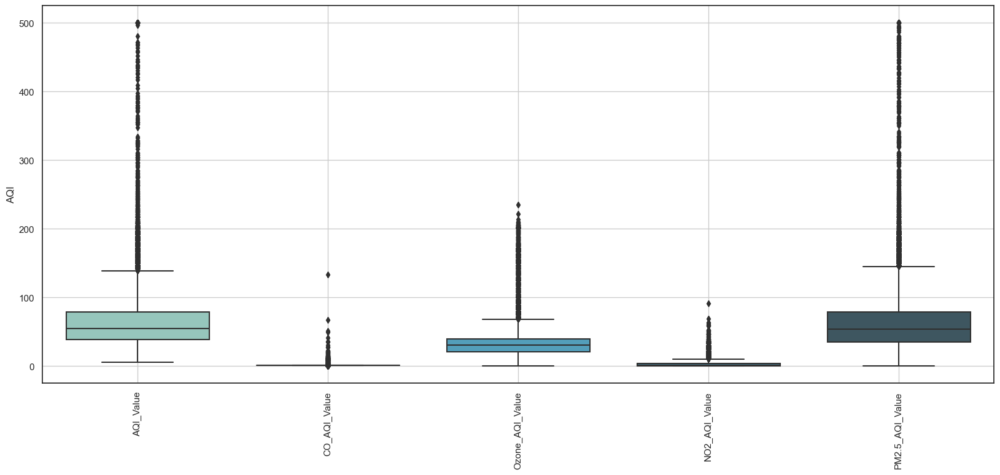

In [282]:
plt.figure(figsize=(20,8))
plt.xticks(rotation=90)
bplot = sns.boxplot( data=df,  width=0.75,palette="GnBu_d")
plt.ylabel('AQI');
bplot.grid(True)

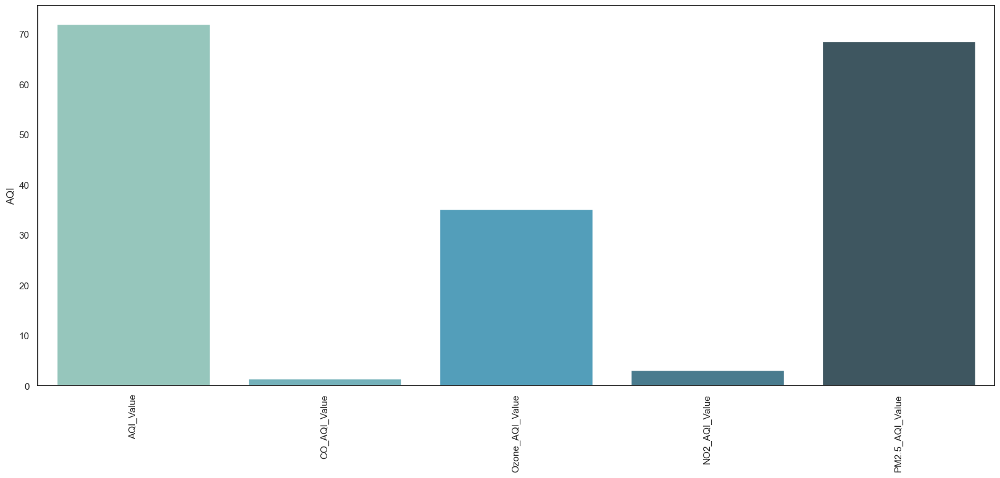

In [284]:
df3 = df.mean(axis=0)
plt.figure(figsize=(20,8))
plt.xticks(rotation=90)
plt.ylabel('AQI')
bplot=sns.barplot(df3.index, df3.values,palette="GnBu_d")

#### AQI Value and PM2.5 AQI Value are large gap among categories.

#### Correlation heatmap

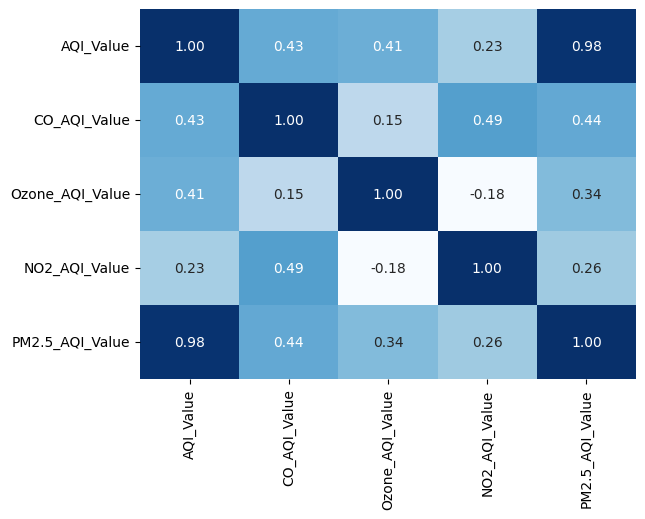

In [20]:
sns.heatmap(df.corr(),annot=True, cbar=False, cmap='Blues', fmt='.2f');

#### Lmplot between AQI Value and PM2.5 AQI Value with AQI Category

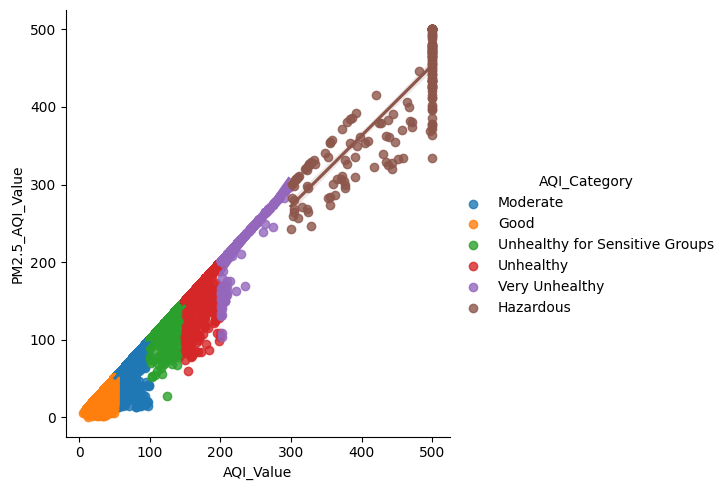

In [21]:
sns.lmplot(data=df,y='PM2.5_AQI_Value',x='AQI_Value',hue="AQI_Category");

####  Lmplot between CO AQI Value and NO2 AQI Value with  AQI Category

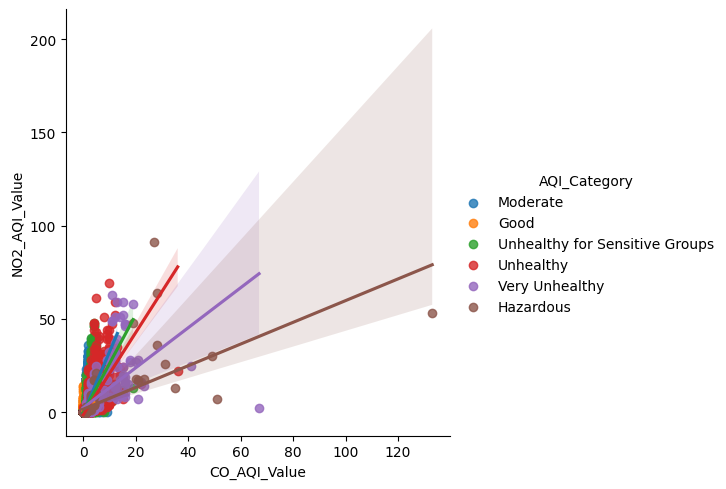

In [22]:
sns.lmplot(data=df,x='CO_AQI_Value',y='NO2_AQI_Value',hue="AQI_Category")

####  Lmplot between CO AQI Value and NO2 AQI Value with PM2.5 AQI Category

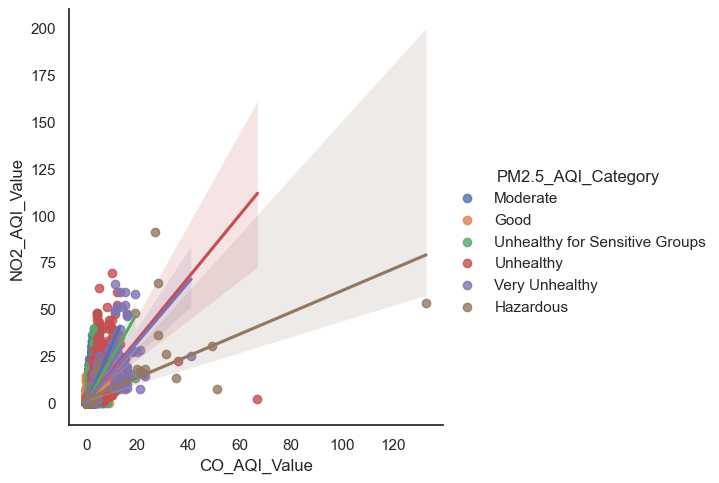

In [117]:
sns.lmplot(data=df,x='CO_AQI_Value',y='NO2_AQI_Value',hue="PM2.5_AQI_Category")

# Finding categorical values and columns

In [30]:
# Find the categorical values: you can use object data type to find categorical values
#Filter categorical variables
categorical_columns = [x for x in df.dtypes.index if df.dtypes[x]=='object']
#Exclude ID cols and source:
categorical_columns = [x for x in categorical_columns 
                       if x not in ['AQI_Category','CO_AQI_Category','NO2_AQI_Category','PM2.5_AQI_Category']]
#Print frequency of categories
for col in categorical_columns:
    print ('\nFrequency of Categories for varible %s'%col)
    print (df[col].value_counts() )



Frequency of Categories for varible Country
United States of America    2872
India                       2488
Brazil                      1562
Germany                     1345
Russian Federation          1241
                            ... 
Aruba                          1
Vanuatu                        1
Saint Lucia                    1
Republic of Korea              1
Monaco                         1
Name: Country, Length: 176, dtype: int64

Frequency of Categories for varible City
Praskoveya        1
Dinklage          1
Dera Din Panah    1
De Pere           1
Damghan           1
                 ..
Vinces            1
Vila              1
Ciudad Valles     1
Citeureup         1
Marang            1
Name: City, Length: 23462, dtype: int64

Frequency of Categories for varible Ozone_AQI_Category
Good                              21069
Moderate                           1445
Unhealthy for Sensitive Groups      491
Unhealthy                           405
Very Unhealthy                   

##### Outlier detection

In [37]:
#Outlier function
def find_outliers_IQR(df):
    q1=df.quantile(0.25)
    q3=df.quantile(0.75)
    IQR=q3-q1
    outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
   
    return outliers

outliers = find_outliers_IQR(df["AQI_Value"])

print ("AQI Value")

df["AQI_Value"].describe()


AQI Value


count    23463.000000
mean        72.010868
std         56.055220
min          6.000000
25%         39.000000
50%         55.000000
75%         79.000000
max        500.000000
Name: AQI_Value, dtype: float64

CO AQI Value


<AxesSubplot:xlabel='CO_AQI_Value'>

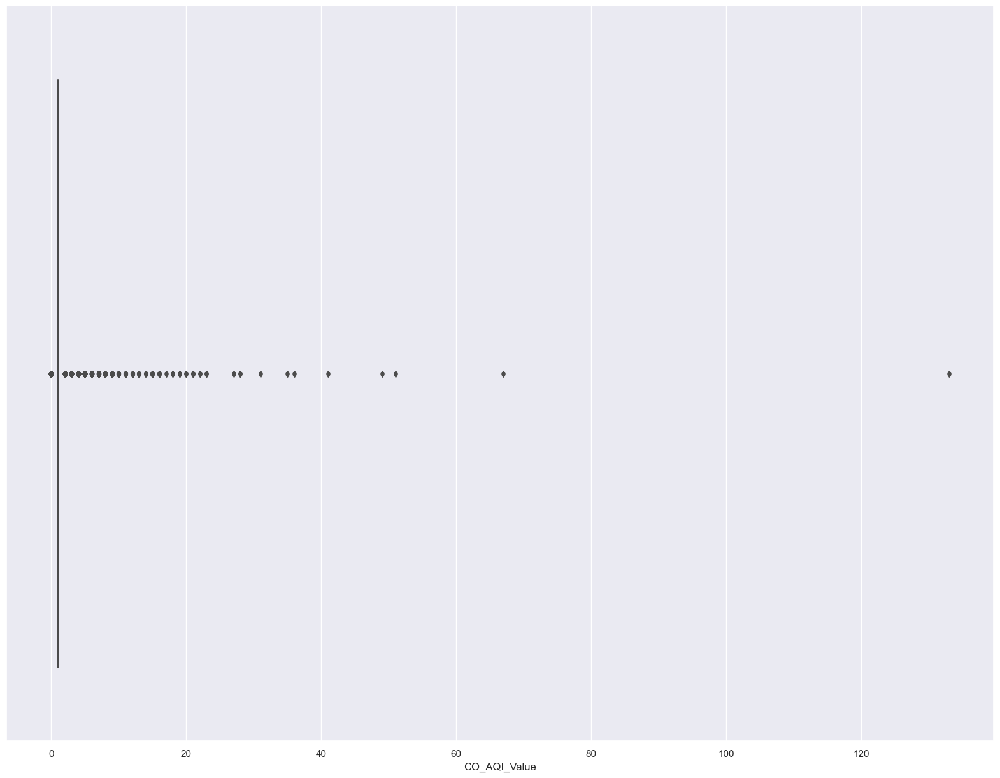

In [327]:
#Detecting CO_AQI_Value outliers

outliers = find_outliers_IQR(df["CO_AQI_Value"])

print ("CO AQI Value")

df["CO_AQI_Value"].describe()

sns.boxplot(df["CO_AQI_Value"])

NO2 AQI Value
number of outliers: 1681
max outlier value: 91
min outlier value: 11


<AxesSubplot:xlabel='NO2_AQI_Value'>

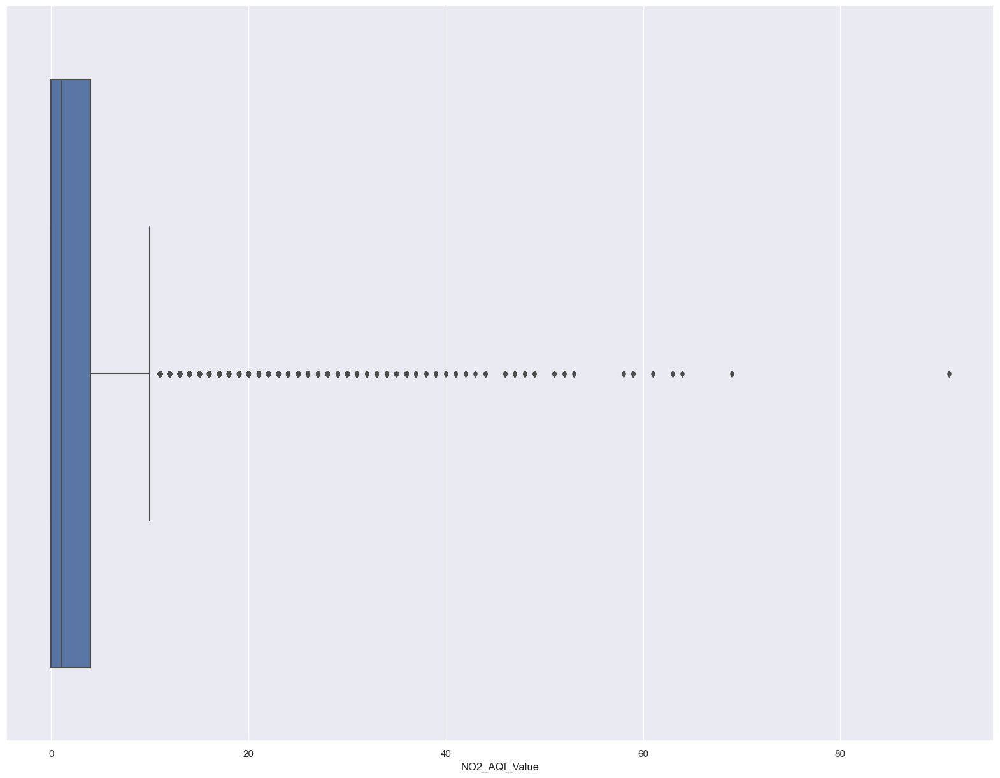

In [328]:
#Detecting NO2 AQI Value outliers

outliers = find_outliers_IQR(df["NO2_AQI_Value"])

print ("NO2 AQI Value")

print("number of outliers: "+ str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

df["NO2_AQI_Value"].describe()
sns.boxplot(df["NO2_AQI_Value"])

Ozone AQI Value
number of outliers: 1513
max outlier value: 235
min outlier value: 69


<AxesSubplot:xlabel='Ozone_AQI_Value'>

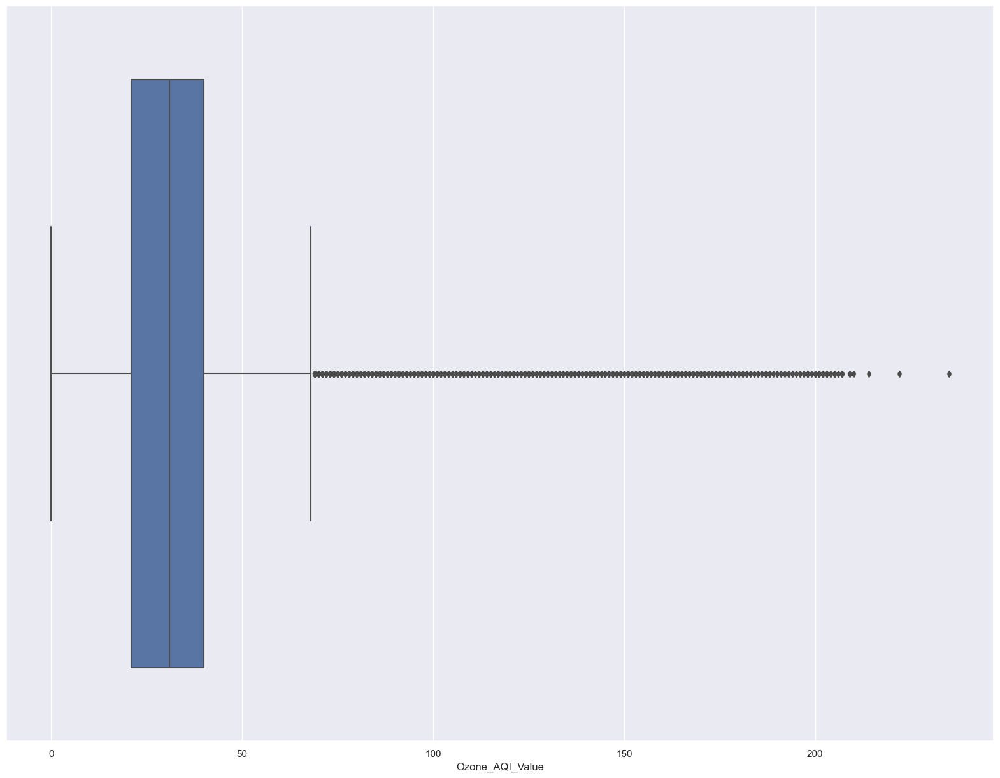

In [329]:
#Detecting Ozone_AQI_Value outliers

outliers = find_outliers_IQR(df["Ozone_AQI_Value"])

print ("Ozone AQI Value")

print("number of outliers: "+ str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

df["Ozone_AQI_Value"].describe()

sns.boxplot(df["Ozone_AQI_Value"])

PM2.5 AQI Value
number of outliers: 2641
max outlier value: 500
min outlier value: 146


<AxesSubplot:xlabel='PM2.5_AQI_Value'>

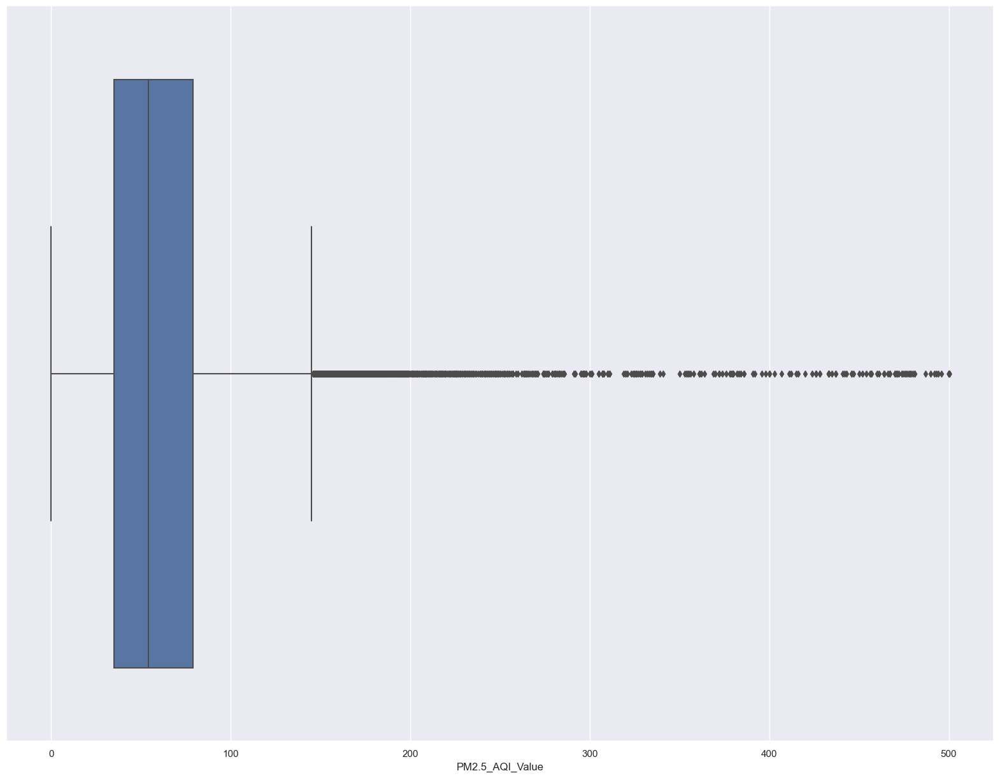

In [330]:
#Detecting PM2.5 AQI Value outliers

outliers = find_outliers_IQR(df["PM2.5_AQI_Value"])

print ("PM2.5 AQI Value")

print("number of outliers: "+ str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

df["PM2.5_AQI_Value"].describe()

sns.boxplot(df["PM2.5_AQI_Value"])

## Chi-Sqaure Test of Variables

In [93]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[['PM2.5_AQI_Category', 'CO_AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['PM2.5_AQI_Category'], data_interim['CO_AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')
#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
print('PM2.5_AQI_Category', 'CO_AQI_Category are: ')
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 207.15286445669307 

p_value is : 5.189103627884136e-39 

degree of freedom is :10
p value is 5.189103627884136e-39
PM2.5_AQI_Category CO_AQI_Category are: 
Dependent (reject H0)


In [92]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[['PM2.5_AQI_Category', 'AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['PM2.5_AQI_Category'], data_interim['AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')

#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
print('PM2.5_AQI_Value', 'AQI_Value are: ')
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 103272.02439705671 

p_value is : 0.0 

degree of freedom is :25
p value is 0.0
PM2.5_AQI_Value AQI_Value are: 
Dependent (reject H0)


In [10]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[['PM2.5_AQI_Category', 'NO2_AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['PM2.5_AQI_Category'], data_interim['NO2_AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')

#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
print('PM2.5_AQI_Value', 'NO2_AQI_Value are:')
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 118954.86766402907 

p_value is : 0.0 

degree of freedom is :22156
p value is 0.0
PM2.5_AQI_Value NO2_AQI_Value are:
Dependent (reject H0)


In [91]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[['PM2.5_AQI_Category', 'Ozone_AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['PM2.5_AQI_Category'], data_interim['Ozone_AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')

#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
print('PM2.5_AQI_Value', 'Ozone_AQI_Value are:')
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 4511.434107139465 

p_value is : 0.0 

degree of freedom is :20
p value is 0.0
PM2.5_AQI_Value Ozone_AQI_Value are:
Dependent (reject H0)


### From the above Chi-sqaure Test we can say that PM2.5 AQI is associated with CO,Ozone,PM2.5,NO2.All these parameters effects PM2.5 AQI levels .If they will increase then PM2.5 AQI also increases and vice-a-versa

In [101]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[['Ozone_AQI_Category', 'CO_AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['Ozone_AQI_Category'], data_interim['CO_AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')

#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 220.03817316894725 

p_value is : 3.779773899661075e-43 

degree of freedom is :8
p value is 3.779773899661075e-43
Dependent (reject H0)


#### From the above Chi-sqaure Test we can say that  CO and Ozone are  statistically associated


In [95]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[['PM2.5_AQI_Category', 'AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['PM2.5_AQI_Category'], data_interim['AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')

#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
print('PM2.5_AQI_Category', 'AQI_Category are:')
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 103272.02439705671 

p_value is : 0.0 

degree of freedom is :25
p value is 0.0
PM2.5_AQI_Category AQI_Category are:
Dependent (reject H0)


#### From the above Chi-sqaure Test we can say that  AQI and PM2.5 are  associated


In [98]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[[ 'Ozone_AQI_Category','AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['Ozone_AQI_Category'],data_interim['AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')

#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 11510.733823615257 

p_value is : 0.0 

degree of freedom is :20
p value is 0.0
Dependent (reject H0)


In [97]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[['AQI_Category', 'NO2_AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['AQI_Category'], data_interim['NO2_AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')

#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 343.5434216626378 

p_value is : 4.296076787513337e-72 

degree of freedom is :5
p value is 4.296076787513337e-72
Dependent (reject H0)


In [99]:
#----------step 1: Extract required columns, ideally it should be two columns at a time
data_interim=df[['Ozone_AQI_Category', 'NO2_AQI_Category']]
#----------step 2: Create a cross tab which is a contigency table
data_cont=pd.crosstab(data_interim['Ozone_AQI_Category'], data_interim['NO2_AQI_Category'])
data_cont
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_cont)
print(f'\nChi-square is : {stat}', f'\n\np_value is : {p}', f'\n\ndegree of freedom is :{dof}')

#-----------interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    
    print('Dependent (reject H0)')
    
else:
    print('Independent (H0 holds true)')


Chi-square is : 1.705490156556808 

p_value is : 0.7897200899113804 

degree of freedom is :4
p value is 0.7897200899113804
Independent (H0 holds true)


#### From the above Chi-sqaure Test we can say that there no association between Ozone and NO2


# Outlier represtation in Box Plot

<AxesSubplot:xlabel='PM2.5_AQI_Value', ylabel='Density'>

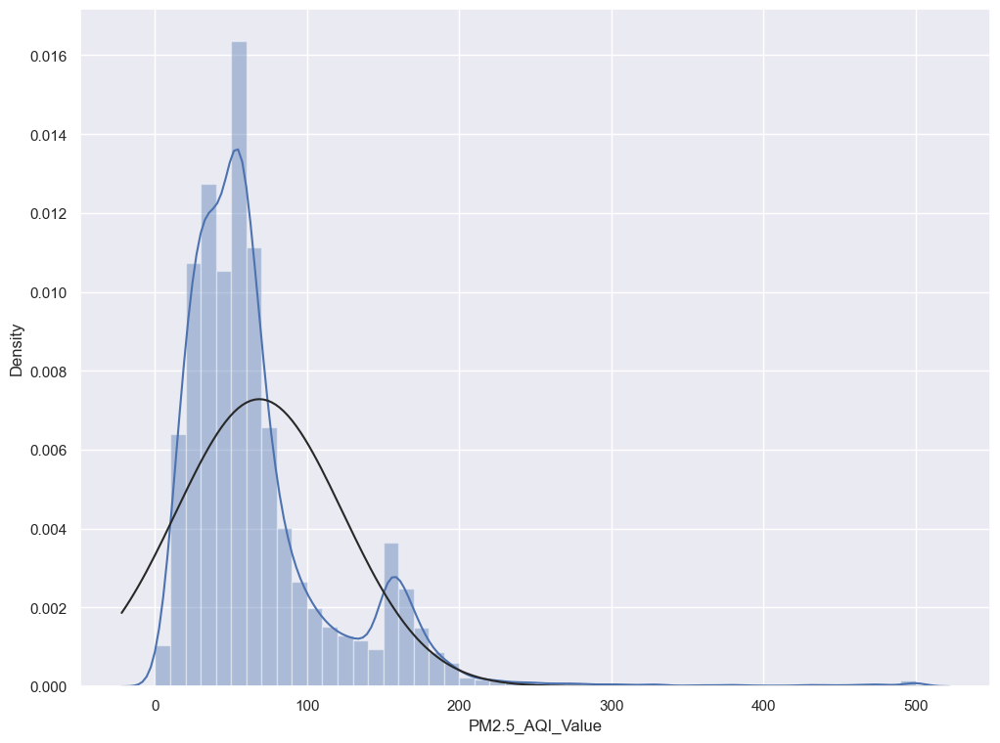

In [340]:
from scipy.stats import norm
plt.figure(figsize=(12,9))
sns.distplot(df['PM2.5_AQI_Value'], fit= norm)

In [105]:
fig = go.Figure()
fig.add_trace(go.Scattermapbox(
    lat=df.Latitude, lon=df.Longitude,
    mode='markers',
    marker=go.scattermapbox.Marker(color='#EC5840',size=4),
    text=df.AQI_Value,
    hoverinfo = 'text'
    ))
fig.add_trace(go.Scattermapbox(
    lat=df.Latitude, lon=df.Longitude,
    mode='markers',
    marker=go.scattermapbox.Marker(color='#4E2F90',size=4),
    text=df.City,
    hoverinfo = 'text'
    ))
fig.update_layout(mapbox_style="open-street-map",autosize=True,showlegend=False,height=500, margin={"r":0,"t":0,"l":0,"b":0}) 
fig.show()

# 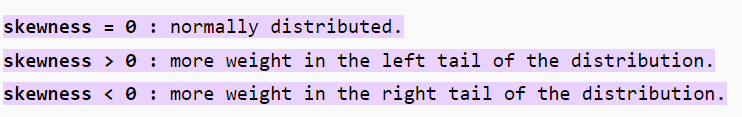

In [341]:
print("Skewness" ,scipy.stats.skew(df['PM2.5_AQI_Value'], axis=0, bias=True) )
print("Kutosis: ",scipy.stats.kurtosis(df['PM2.5_AQI_Value'], axis=0, bias=True) )

Skewness 2.8230819252729877
Kutosis:  13.619304475055742


In [342]:
#lower outer fence
#lower outer fence: Q1 - 3*IQR
#upper outer fence: Q3 + 3*IQR
def fixing_outliers(col):#col is name of column that you want to fix its outliers
    i=0 # i is number of outliers that they are less than lower outer fence
    j=0 # j is  number of outliers that they are bigger than upper outer fence
    Q1=df[col].quantile(0.25) # finding 1st quartile(lowe quartile)
    Q3=df[col].quantile(0.75) # finding 3rd quartile(upper quartile)
    IQR=Q3-Q1 #calculationg Inter Quartile Range
    UOF1=Q3+3*(IQR)#UOF=upper outer fence
    LOF1=Q1-3*(IQR)#LOF=lower outer fence
    Clean_col=[] # Create an ematy list to append value to it
    for val in df[col]:#val is value of that column . here we select values of that column one by one and execute the loop
        if val<LOF1:   
            Clean_col.append(LOF1)# if value is less than LOF we will repalce that with LOF
            i+=1
        elif val>UOF1 :  # if value is bigger than UOF we will repalce that with UOF 
            Clean_col.append(UOF1)
            j+=1
        else : Clean_col.append(val)
    df[col]=Clean_col # update the column by assigning Clean_col
    sns.distplot(df[col])#Plotting univariate distributions
    print(f'Number of outliers that they are less than lower outer fence({LOF1}): ',i,f'\nNumber of outliers that they are bigger than upper outer fence ({UOF1}) : ',j)
    return df[col] .describe()

# AQI spread on Map

C:\Users\shail\AppData\Roaming\Python\Python39\site-packages\mpl_toolkits\basemap\__init__.py:33: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\AppData\Roaming\Python\Python39\site-packages\mpl_toolkits\basemap\__init__.py:34: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



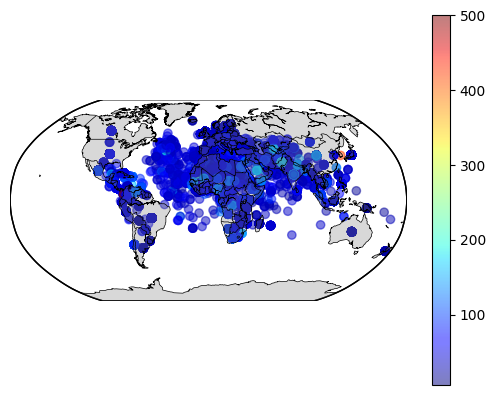

In [30]:

from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np

# create a new map
m = Basemap(projection='robin', lon_0=0, resolution='c')

# load air pollution data


# get latitude and longitude values from the data
lat = df["Latitude"]
lon = df["Longitude"]

# get air pollution values from the data
pollution = df["AQI_Value"]

# plot the data on the map using color coding
x, y = m(lon, lat)
m.scatter(x, y, c=pollution, cmap='jet', alpha=0.5)

# draw coastlines, countries, and continents
m.drawcoastlines(linewidth=0.5)
m.drawcountries(linewidth=0.5)
m.fillcontinents(color='gray', alpha=0.3)

# draw the map boundaries
m.drawmapboundary(fill_color='white')

# add a colorbar legend
plt.colorbar()

# display the map
plt.show()

# PM2.5 spread on Map

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



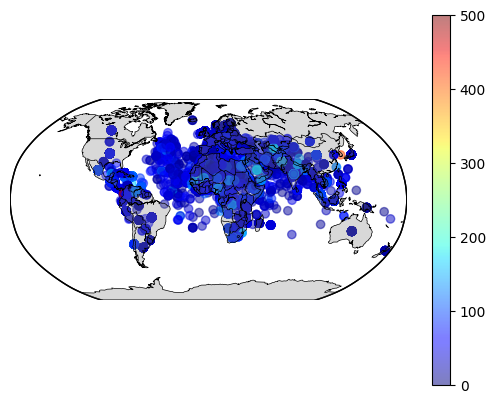

In [31]:

from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np

# create a new map
m = Basemap(projection='robin', lon_0=0, resolution='c')

# load air pollution data


# get latitude and longitude values from the data
lat = df["Latitude"]
lon = df["Longitude"]

# get air pollution values from the data
pollution = df["PM2.5_AQI_Value"]

# plot the data on the map using color coding
x, y = m(lon, lat)
m.scatter(x, y, c=pollution, cmap='jet', alpha=0.5)

# draw coastlines, countries, and continents
m.drawcoastlines(linewidth=0.5)
m.drawcountries(linewidth=0.5)
m.fillcontinents(color='gray', alpha=0.3)

# draw the map boundaries
m.drawmapboundary(fill_color='white')

# add a colorbar legend
plt.colorbar()

# display the map
plt.show()

# CO spread on Map

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



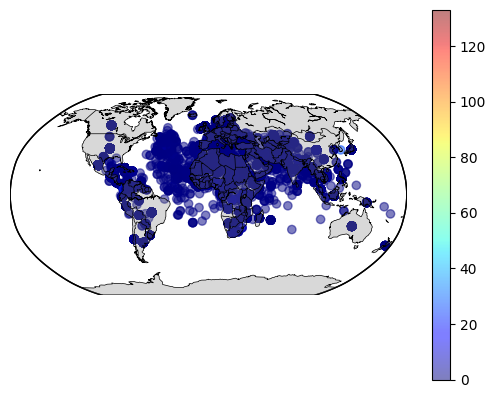

In [32]:

from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np

# create a new map
m = Basemap(projection='robin', lon_0=0, resolution='c')

# load air pollution data

#India = df[df['Country'] == 'India'].set_index(['PM2.5_AQI_Value'])
# get latitude and longitude values from the data
lat = df["Latitude"]
lon = df["Longitude"]

# get air pollution values from the data
pollution = df["CO_AQI_Value"]

# plot the data on the map using color coding
x, y = m(lon, lat)
m.scatter(x, y, c=pollution, cmap='jet', alpha=0.5)

# draw coastlines, countries, and continents
m.drawcoastlines(linewidth=0.5)
m.drawcountries(linewidth=0.5)
m.fillcontinents(color='gray', alpha=0.3)

# draw the map boundaries
m.drawmapboundary(fill_color='white')

# add a colorbar legend
plt.colorbar()

# display the map
plt.show()

# NO2 spread accross the countries

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



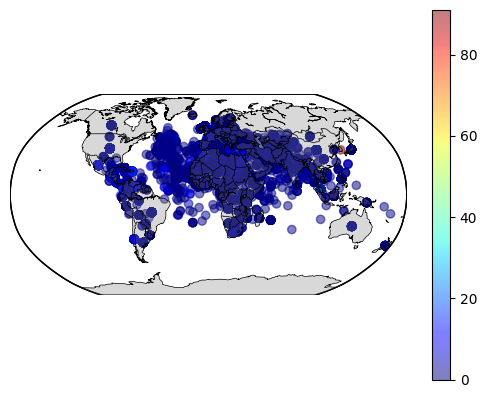

In [33]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np

# create a new map
m = Basemap(projection='robin', lon_0=0, resolution='c')

# load air pollution data

#India = df[df['Country'] == 'India'].set_index(['PM2.5_AQI_Value'])
# get latitude and longitude values from the data
lat = df["Latitude"]
lon = df["Longitude"]

# get air pollution values from the data
pollution = df["NO2_AQI_Value"]

# plot the data on the map using color coding
x, y = m(lon, lat)
m.scatter(x, y, c=pollution, cmap='jet', alpha=0.5)

# draw coastlines, countries, and continents
m.drawcoastlines(linewidth=0.5)
m.drawcountries(linewidth=0.5)
m.fillcontinents(color='gray', alpha=0.3)

# draw the map boundaries
m.drawmapboundary(fill_color='white')

# add a colorbar legend
plt.colorbar()

# display the map
plt.show()

# Ozone AQI spread across the countries

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\anaconda3\lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



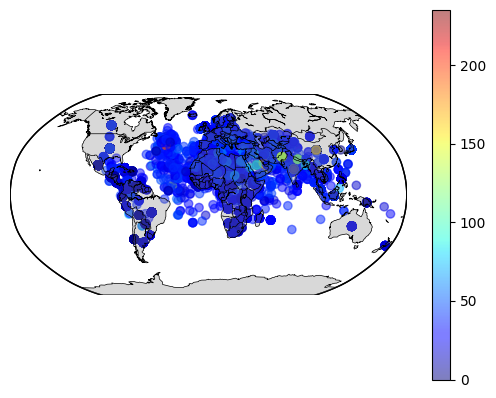

In [34]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np

# create a new map
m = Basemap(projection='robin', lon_0=0, resolution='c')

# load air pollution data

#India = df[df['Country'] == 'India'].set_index(['PM2.5_AQI_Value'])
# get latitude and longitude values from the data
lat = df["Latitude"]
lon = df["Longitude"]

# get air pollution values from the data
pollution = df["Ozone_AQI_Value"]

# plot the data on the map using color coding
x, y = m(lon, lat)
m.scatter(x, y, c=pollution, cmap='jet', alpha=0.5)

# draw coastlines, countries, and continents
m.drawcoastlines(linewidth=0.5)
m.drawcountries(linewidth=0.5)
m.fillcontinents(color='gray', alpha=0.3)

# draw the map boundaries
m.drawmapboundary(fill_color='white')

# add a colorbar legend
plt.colorbar()

# display the map
plt.show()

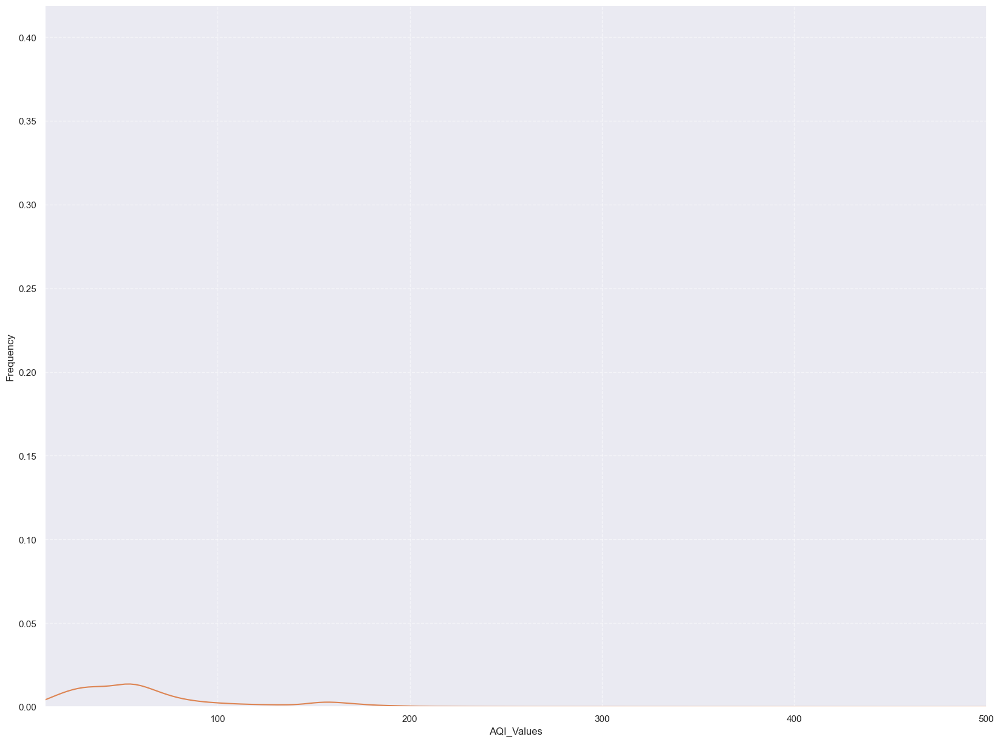

In [343]:

#x-axis ranges from -3 and 3 with .001 steps
x = np.arange(-3, 3, 0.001)

#plot normal distribution with mean 0 and standard deviation 1
plt.plot(x, norm.pdf(x, 0, 1))

sns.kdeplot(data = df['PM2.5_AQI_Value'])
plt.xlim([10,500])  
plt.xlabel("AQI_Values", size=12)    
plt.ylabel("Frequency", size=12)                
plt.grid(True, alpha=0.5, linestyle="--")     
plt.show()

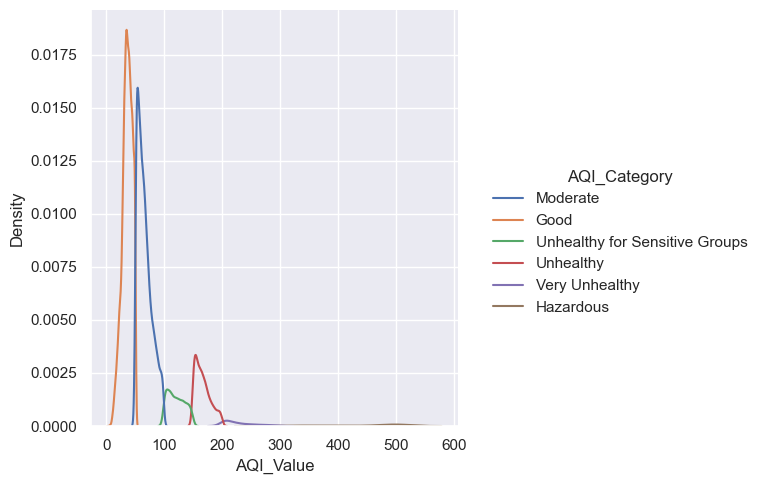

In [345]:
sns.displot(data=df,x='AQI_Value', hue='AQI_Category',kind='kde')


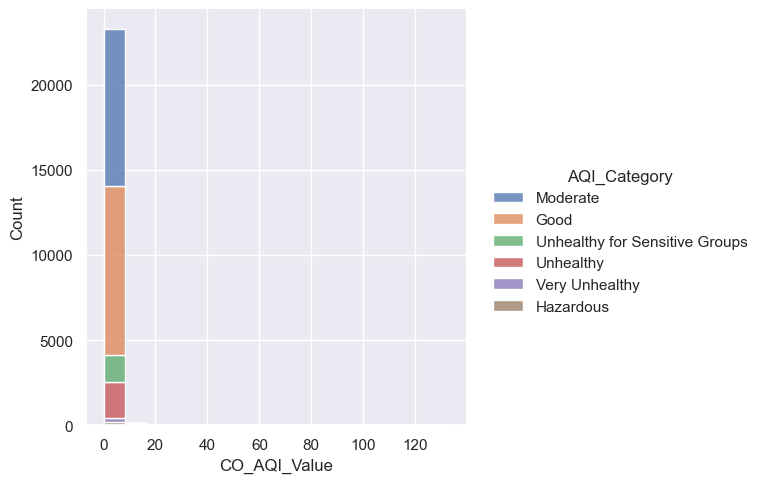

In [346]:

sns.displot(data=df,x='CO_AQI_Value',hue='AQI_Category',multiple='stack')


C:\Users\shail\anaconda3\lib\site-packages\seaborn\axisgrid.py:130: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\anaconda3\lib\site-packages\seaborn\axisgrid.py:130: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



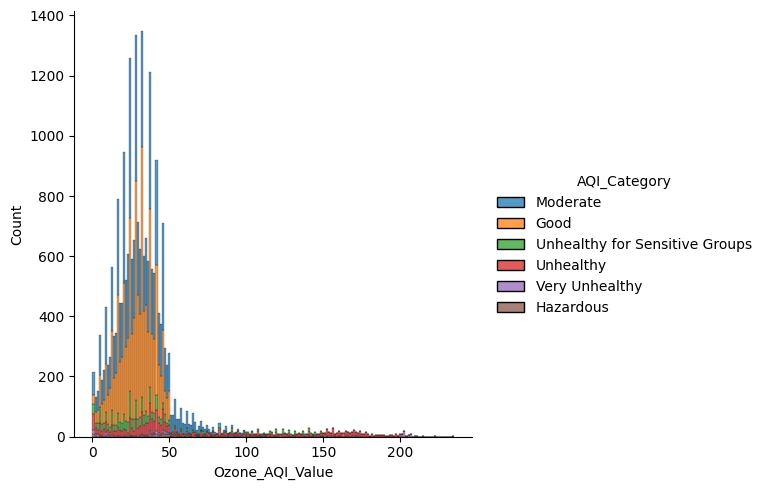

In [65]:

sns.displot(data=df,x='Ozone_AQI_Value',hue='AQI_Category',multiple='stack')


C:\Users\shail\anaconda3\lib\site-packages\seaborn\axisgrid.py:130: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\shail\anaconda3\lib\site-packages\seaborn\axisgrid.py:130: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



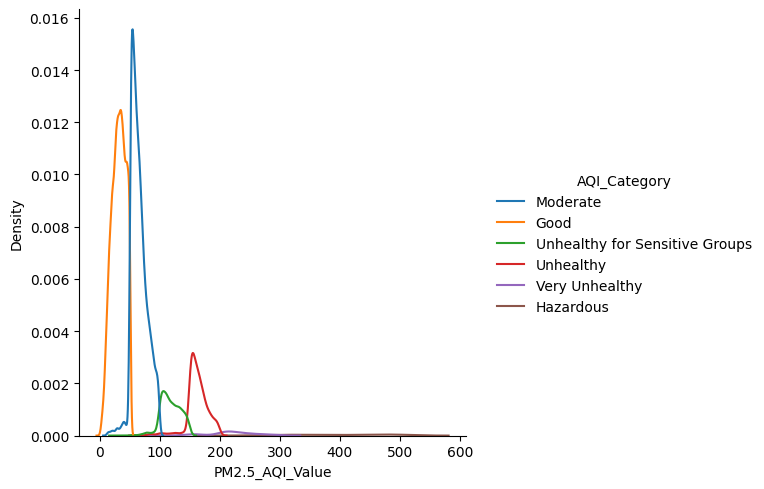

In [66]:

sns.displot(data=df,x='PM2.5_AQI_Value',hue='AQI_Category',kind='kde')

##### PM2.5 AQI Value and PM2.5 AQI Category in Country and Cities 

Text(0.5, 1.0, 'Most Country have worst overall PM2.5 AQI value')

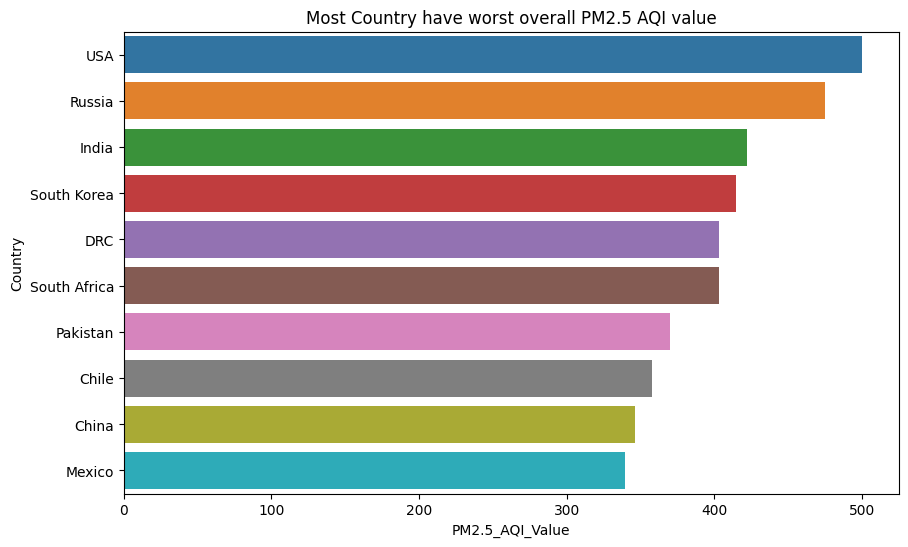

In [29]:
aqi = df[['Country','City','PM2.5_AQI_Value','PM2.5_AQI_Category']] #subset of dataset
aqi_hazard = aqi[aqi['PM2.5_AQI_Category'] == 'Hazardous']
hazardous = aqi_hazard.groupby('Country',as_index=False)['PM2.5_AQI_Value'].mean().sort_values(by='PM2.5_AQI_Value',ascending=False)

plt.figure(figsize=(10,6))
sns.barplot(x='PM2.5_AQI_Value', y='Country',data=hazardous)
plt.title('Most Country have worst overall PM2.5 AQI value')

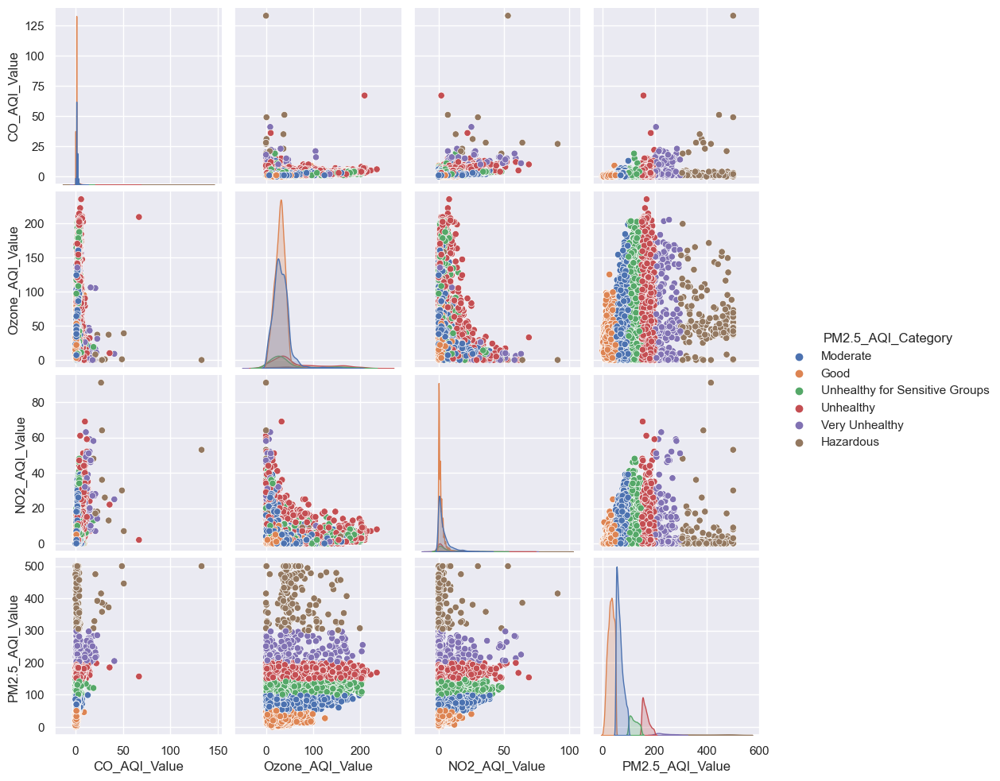

In [350]:
sns.pairplot(df.iloc[:,3:], hue = "PM2.5_AQI_Category")
plt.show()

In [10]:
np.arange(0,12)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [11]:
df1 = df.copy()
# Select columns
df1 = df1.iloc[:,[3,  5,  7,  9, 2,  4,  6,  8,  10, 11]]
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23463 entries, 0 to 23462
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   AQI_Category        23463 non-null  object
 1   CO_AQI_Category     23463 non-null  object
 2   Ozone_AQI_Category  23463 non-null  object
 3   NO2_AQI_Category    23463 non-null  object
 4   AQI_Value           23463 non-null  int64 
 5   CO_AQI_Value        23463 non-null  int64 
 6   Ozone_AQI_Value     23463 non-null  int64 
 7   NO2_AQI_Value       23463 non-null  int64 
 8   PM2.5_AQI_Value     23463 non-null  int64 
 9   PM2.5_AQI_Category  23463 non-null  object
dtypes: int64(5), object(5)
memory usage: 1.8+ MB


In [12]:
col = list(df1.columns)

predictor = col[:-1]

display(predictor)

target = col[-1]
display(target)



['AQI_Category',
 'CO_AQI_Category',
 'Ozone_AQI_Category',
 'NO2_AQI_Category',
 'AQI_Value',
 'CO_AQI_Value',
 'Ozone_AQI_Value',
 'NO2_AQI_Value',
 'PM2.5_AQI_Value']

'PM2.5_AQI_Category'

In [13]:
def unique(i):
    print("For {}".format(i))
    print(df1[i].unique())
    print("-------------------------------")
    
for i in df1.columns:
    unique(i)

For AQI_Category
['Moderate' 'Good' 'Unhealthy for Sensitive Groups' 'Unhealthy'
 'Very Unhealthy' 'Hazardous']
-------------------------------
For CO_AQI_Category
['Good' 'Unhealthy for Sensitive Groups' 'Moderate']
-------------------------------
For Ozone_AQI_Category
['Good' 'Moderate' 'Unhealthy for Sensitive Groups' 'Unhealthy'
 'Very Unhealthy']
-------------------------------
For NO2_AQI_Category
['Good' 'Moderate']
-------------------------------
For AQI_Value
[ 51  41  66  34  22  54  62  64 142  68 158  83  59 154  55  72 161  28
 118  33 150  81  67  31  56  77  44  30  79  61  32  29 247  45  36 124
 157  60 153  47  37  58  89  52  38  88  42 189  49 203  35  90  48  19
  73 170 155  46 172  21 166  27  23 168  40 133  50  25  65  53  57 167
  80 163 126  63  86  78 112 121 160 144  69  84  20  75  98 103 307 151
 102 115  17 127 125  92 143 187 156 105 198 139 145  13  26 107  76 104
  39  97 194  70 500 380 222 117 182 171  91  71  24 152  93 132 179 202
  94 101  74 44

#### Label Encoding

In [14]:

import sklearn
from sklearn.preprocessing import LabelEncoder

def label(i):
    df1[i] = LabelEncoder().fit_transform(df1[i])
    return df[i]

for i in df1.iloc[:,:4].columns:
    label(i)

df1

,AQI_Category,CO_AQI_Category,Ozone_AQI_Category,NO2_AQI_Category,AQI_Value,CO_AQI_Value,Ozone_AQI_Value,NO2_AQI_Value,PM2.5_AQI_Value,PM2.5_AQI_Category
0,2,0,0,0,51,1,36,0,51,Moderate
1,0,0,0,0,41,1,5,1,41,Good
2,2,0,0,0,66,1,39,2,66,Moderate
3,0,0,0,0,34,1,34,0,20,Good
4,0,0,0,0,22,0,22,0,6,Good
...,...,...,...,...,...,...,...,...,...,...
23458,3,0,2,0,184,3,154,2,184,Unhealthy
23459,0,0,0,0,50,1,20,5,50,Good
23460,0,0,0,0,50,1,22,1,50,Good
23461,2,0,0,0,71,1,44,2,71,Moderate


In [15]:
#Checking Unbalanced Classes

# Compute the class distribution of the target variable
class_distribution = df['PM2.5_AQI_Category'].value_counts(normalize=True)

# Print the class distribution
print(class_distribution)

Good                              0.435068
Moderate                          0.386779
Unhealthy                         0.090739
Unhealthy for Sensitive Groups    0.069215
Very Unhealthy                    0.010868
Hazardous                         0.007331
Name: PM2.5_AQI_Category, dtype: float64


based on the class distribution you provided, it seems that you have an unbalanced class problem. The class 'Hazardous' has the lowest proportion of samples (0.007331), while the class 'Good' has the highest proportion (0.435068).

#### Splitting the DataSet

In [16]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
df2 =df1.copy()


# Encode the categorical target variable to numerical values
le = LabelEncoder()
df2['PM2.5_AQI_Category'] = le.fit_transform(df['PM2.5_AQI_Category'])

# Separate the features and target variable
X = df2.drop('PM2.5_AQI_Category', axis=1)
y = df2['PM2.5_AQI_Category']

# Apply SMOTE to the training data only
smote = SMOTE()
X_train, y_train = smote.fit_resample(X, y)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.3, random_state=42)

print('Train set shape:', X_train.shape, y_train.shape)
print('Test set shape:', X_test.shape, y_test.shape)

Train set shape: (42873, 9) (42873,)
Test set shape: (18375, 9) (18375,)


In [17]:
df2.rename(columns={"PM2.5_AQI_Value": "PM_Value"}, inplace=True)


In [47]:
df2

,AQI_Category,CO_AQI_Category,Ozone_AQI_Category,NO2_AQI_Category,AQI_Value,CO_AQI_Value,Ozone_AQI_Value,NO2_AQI_Value,PM_Value,PM2.5_AQI_Category
0,2,0,0,0,51,1,36,0,51,2
1,0,0,0,0,41,1,5,1,41,0
2,2,0,0,0,66,1,39,2,66,2
3,0,0,0,0,34,1,34,0,20,0
4,0,0,0,0,22,0,22,0,6,0
...,...,...,...,...,...,...,...,...,...,...
23458,3,0,2,0,184,3,154,2,184,3
23459,0,0,0,0,50,1,20,5,50,0
23460,0,0,0,0,50,1,22,1,50,0
23461,2,0,0,0,71,1,44,2,71,2


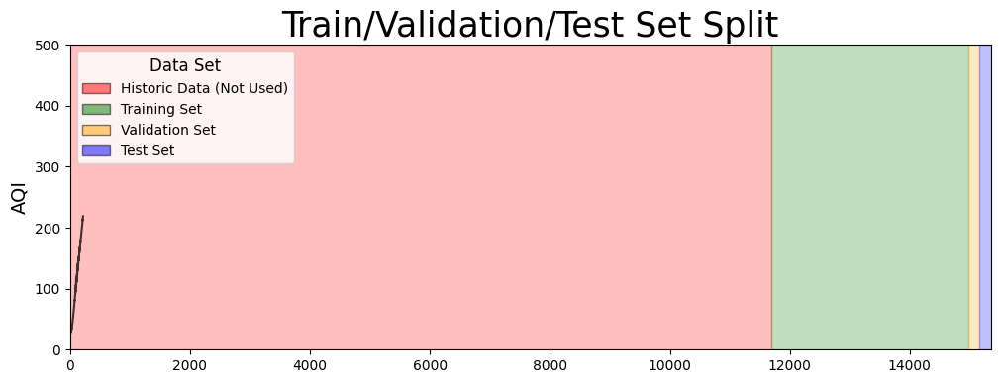

In [18]:
#plots the split of training, validation, and training data



from matplotlib.patches import Patch
aqi = df2.groupby('PM_Value').AQI_Value.mean().loc[:219]
aqi.plot(figsize=(12,4), color='black', alpha=0.75)
plt.title('Train/Validation/Test Set Split', {'size': 25, 'weight': 'bold'})

# adds color patches 
historic = plt.Rectangle((-1_000,0), 12_688, 500, fc='red',ec="red", alpha=0.25)
train = plt.Rectangle((11_688,0), 3_287, 500, fc='green',ec="green", alpha=0.25)
validation = plt.Rectangle((14_975,0), 188, 500, fc='orange',ec="orange", alpha=0.25)
test = plt.Rectangle((15_163,0), 17_500, 500, fc='blue',ec="blue", alpha=0.25)


plt.gca().add_patch(historic)
plt.gca().add_patch(train)
plt.gca().add_patch(validation)
plt.gca().add_patch(test)


plt.xlabel('')
plt.ylabel('AQI', {'size': 14, 'weight': 'bold'})

plt.ylim(0, 500)
plt.xlim(0, 15_350)

#Sets up legend

legend_elements = [
    Patch(facecolor='red', edgecolor='black', alpha=0.5, label='Historic Data (Not Used)'),
    Patch(facecolor='green', edgecolor='black', alpha=0.5, label='Training Set'),
    Patch(facecolor='orange', edgecolor='black', alpha=0.5, label='Validation Set'),
    Patch(facecolor='blue', edgecolor='black', alpha=0.5, label='Test Set')
                  ]


legend = plt.legend(handles=legend_elements)
legend.set_title("Data Set", prop = {'size':12, 'weight': 'bold'})

#displays the plot
plt.show()


In [19]:
import numpy as np
import matplotlib.pyplot as plt

def plot_learning_curve(model, X_train, y_train, X_val, y_val):
    # Create arrays to store the training and validation scores
    train_scores = []
    val_scores = []

    # Create an array of sample sizes to train on
    sample_sizes = np.linspace(1, len(X_train), 10).astype(int)

    # Train the model on increasingly large samples of data
    for sample_size in sample_sizes:
        model.fit(X_train[:sample_size], y_train[:sample_size])

        # Calculate the training and validation scores for this sample size
        train_score = model.score(X_train[:sample_size], y_train[:sample_size])
        val_score = model.score(X_val, y_val)

        # Add the scores to the arrays
        train_scores.append(train_score)
        val_scores.append(val_score)

    # Plot the learning curve
    plt.plot(sample_sizes, train_scores, 'o-', label='Training Score')
    plt.plot(sample_sizes, val_scores, 'o-', label='Validation Score')
    plt.xlabel('Number of training samples')
    plt.ylabel('Score')
    plt.legend(loc='best')
    plt.show()


### Feature Scaling (Standardization)

In [20]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_std_ = sc.fit_transform(X_train)
X_test_std_ = sc.transform (X_test)
print("Train Standardised")
print()
print(X_train_std_)
print("Test Standardised")
print()
print(X_test_std_)


Train Standardised

[[-0.86838495 -0.02273761  0.67837167 ...  1.02755234 -0.404791
   1.37664359]
 [ 0.91205891 -0.02273761 -0.47937797 ... -0.18804376 -0.52659223
  -0.19187631]
 [-0.27490367 -0.02273761 -0.47937797 ... -0.04503246 -0.52659223
  -0.71216584]
 ...
 [-1.46186624 -0.02273761 -0.47937797 ... -0.47406637 -0.28298977
  -1.16359351]
 [-1.46186624 -0.02273761 -0.47937797 ... -0.83159463 -0.52659223
  -1.17124483]
 [ 1.50554019 -0.02273761  1.83612131 ...  1.28973973 -0.404791
   0.274854  ]]
Test Standardised

[[-1.46186624 -0.02273761 -0.47937797 ... -0.42639594 -0.16118854
  -1.08708035]
 [-0.27490367 -0.02273761  0.67837167 ...  0.19331972 -0.404791
  -0.59739609]
 [-0.27490367 -0.02273761 -0.47937797 ... -0.54557202  0.56961884
  -0.62800135]
 ...
 [ 0.31857762 -0.02273761 -0.47937797 ... -0.52173681 -0.28298977
  -0.16127104]
 [ 0.91205891 -0.02273761  2.99387096 ...  1.90945538 -0.404791
  -0.43671844]
 [ 1.50554019 -0.02273761  1.83612131 ...  2.50533582 -0.404791
   

# K-Fold on Train and Test

In [52]:

kf =model_selection.KFold(n_splits=5, shuffle=True, random_state=42)

cnt = 1
# split()  method generate indices to split data into training and test set.
for train_index, test_index in kf.split(X, y):
    print(f'Fold:{cnt}, Train set: {len(train_index)}, Test set:{len(test_index)}')
    cnt += 1

Fold:1, Train set: 18770, Test set:4693
Fold:2, Train set: 18770, Test set:4693
Fold:3, Train set: 18770, Test set:4693
Fold:4, Train set: 18771, Test set:4692
Fold:5, Train set: 18771, Test set:4692


# Ridge Classifier

We'll define the classifier by using the RidgeClassifier class. We can use the default parameters of the class. The parameters can be changed according to the classification data content.

In [111]:
rc = RidgeClassifier()
print(rc)

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, random_state=None, solver='auto',
                tol=0.001)

RidgeClassifier()


RidgeClassifier(tol=0.001)

In [109]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeClassifier

# Load your data and split into X and y

# Normalize the input features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the RidgeClassifier
rc = RidgeClassifier(alpha=1.0)
rc.fit(X_train, y_train)

# Evaluate the model on the test data
y_pred = rc.predict(X_test)
print(y_pred)

[0 0 0 ... 5 5 5]


Then, we'll fit the model on train data and check the model accuracy score.

In [112]:
rc.fit(X_train, y_train)
score = rc.score(X_train, y_train)
print("Score: ", score)



Score:  0.6625148694982856


We can also apply a cross-validation training method to the model and check the training score

In [72]:

cv_scores = cross_val_score(rc, X_train, y_train, cv=10)
print("CV average score: %.2f" % cv_scores.mean())


CV average score: 0.66


### Predicting and accuracy check

Now, we can predict the test data by using the trained model. After the prediction, we'll check the accuracy level by using the confusion matrix function.

In [73]:
ypred = rc.predict(X_test)

cm = confusion_matrix(y_test, ypred)
print(cm)


[[3059    0    0    0    3    0]
 [   0 3084    0    0    0    0]
 [2965    0   10    1   48    0]
 [   0    0    0 1171  705 1227]
 [   0    0    0  307 2105  610]
 [   0  253    0    7   15 2805]]


We can also create a classification report by using classification_report() function on predicted data to check the other accuracy metrics.

In [74]:
cr = classification_report(y_test, ypred)
print(cr)

              precision    recall  f1-score   support

           0       0.51      1.00      0.67      3062
           1       0.92      1.00      0.96      3084
           2       1.00      0.00      0.01      3024
           3       0.79      0.38      0.51      3103
           4       0.73      0.70      0.71      3022
           5       0.60      0.91      0.73      3080

    accuracy                           0.67     18375
   macro avg       0.76      0.66      0.60     18375
weighted avg       0.76      0.67      0.60     18375



# Classification Algorithms

### 1. Decision Tree

In [53]:
model = DecisionTreeClassifier(random_state = 0)

model.fit(X_train, y_train)

print("For Test Data")
test_pred = model.predict(X_test)
from sklearn.metrics import confusion_matrix, accuracy_score

display(pd.crosstab(y_test, test_pred, rownames=["Actual"], colnames=["Prediction"]))
display(accuracy_score(test_pred, y_test))

print()
print("For Train Data")
train_pred = model.predict(X_train)

from sklearn.metrics import confusion_matrix, accuracy_score

display(pd.crosstab(y_train, train_pred, rownames=["Actual"], colnames=["Prediction"]))
print(accuracy_score(train_pred, y_train))

For Test Data


Prediction,0,1,2,3,4,5
Actual,,,,,,
0,3062,0,0,0,0,0
1,0,3084,0,0,0,0
2,0,0,3024,0,0,0
3,0,0,0,3103,0,0
4,0,0,0,0,3022,0
5,0,0,0,0,0,3080


1.0


For Train Data


Prediction,0,1,2,3,4,5
Actual,,,,,,
0,7146,0,0,0,0,0
1,0,7124,0,0,0,0
2,0,0,7184,0,0,0
3,0,0,0,7105,0,0
4,0,0,0,0,7186,0
5,0,0,0,0,0,7128


1.0



Interpreting the output of Decision Tree:



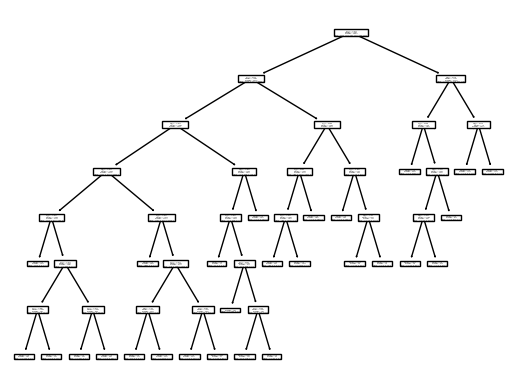

In [76]:

from sklearn import tree
DT_model = DecisionTreeClassifier(random_state=0)

param = {"criterion":["gini", "entropy", "log_loss"], 
            "splitter":["best", "random"], 
            "max_depth":list(range(1,50)), 
            "min_samples_split":list(range(2,50)), 
            "min_samples_leaf":list(range(1,50)), 
            "max_features":["auto", "sqrt", "log2"], 
            "max_leaf_nodes":list(range(1,50))}

#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

RCV = RandomizedSearchCV(DT_model,
                            param_distributions = param,
                            scoring = "accuracy",
                            n_jobs = -1,
                            random_state = 0,
                            cv = 5)

DT = RCV.fit(X_train_std_, y_train).best_estimator_
pred = DT.predict(X_test_std_)
pred_prob = DT.predict_proba(X_test_std_)


print('\n\033[1mInterpreting the output of Decision Tree:\n\033[0m')
tree.plot_tree(DT)
plt.show()

In [77]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3062
           1       1.00      1.00      1.00      3084
           2       1.00      0.99      1.00      3024
           3       1.00      1.00      1.00      3103
           4       0.99      1.00      1.00      3022
           5       1.00      1.00      1.00      3080

    accuracy                           1.00     18375
   macro avg       1.00      1.00      1.00     18375
weighted avg       1.00      1.00      1.00     18375



## RandomizedSearchCV
Randomized search CV (Cross-Validation) is used when you want to tune the hyperparameters of your machine learning model. Hyperparameters are values that are set before training the model, such as the learning rate in a neural network or the maximum depth of a decision tree.

In [54]:
from sklearn.model_selection import RandomizedSearchCV

param = {"criterion":["gini", "entropy", "log_loss"], 
            "splitter":["best", "random"], 
            "max_depth":list(range(1,50)), 
            "min_samples_split":list(range(2,50)), 
            "min_samples_leaf":list(range(1,50)), 
            "max_features":["auto", "sqrt", "log2"], 
            "max_leaf_nodes":list(range(1,50))}

In [55]:
model = RandomizedSearchCV(estimator = DecisionTreeClassifier(random_state = 0),
                            param_distributions = param,
                            scoring = "accuracy",
                            n_jobs = -1,
                            random_state = 0,
                            cv = 5).fit(X_train, y_train)

model

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=0),
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14, 15,
                                                      16, 17, 18, 19, 20, 21,
                                                      22, 23, 24, 25, 26, 27,
                                                      28, 29, 30, ...],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'max_leaf_nodes': [1, 2, 3, 4, 5, 6, 7,
                                                           8, 9, 10, 11, 12, 13,
                                                           14, 15, 16, 17, 18,
                                                           19, 20, 21, 22, 23,
                                                           24, 25, 26, 27, 28,
                                                           29, 30, ...],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10, 11,
                                                             12, 13, 14, 15, 16,
                                                             17, 18, 19, 20, 21,
                                                             22, 23, 24, 25, 26,
                                                             27, 28, 29, 30, ...],
                                        'min_samples_split': [2, 3, 4, 5, 6, 7,
                                                              8, 9, 10, 11, 12,
                                                              13, 14, 15, 16,
                                                              17, 18, 19, 20,
                                                              21, 22, 23, 24,
                                                              25, 26, 27, 28,
                                                              29, 30, 31, ...],
                                        'splitter': ['best', 'random']},
                   random_state=0, scoring='accuracy')

In [56]:
model.best_params_

{'splitter': 'best',
 'min_samples_split': 27,
 'min_samples_leaf': 46,
 'max_leaf_nodes': 40,
 'max_features': 'auto',
 'max_depth': 10,
 'criterion': 'entropy'}

In [57]:
Dt=model.best_score_

In [58]:
DT_model = model.best_estimator_
DT_model

DecisionTreeClassifier(criterion='entropy', max_depth=10, max_features='auto',
                       max_leaf_nodes=40, min_samples_leaf=46,
                       min_samples_split=27, random_state=0)

In [59]:
print("For Test Data")
test_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix, accuracy_score

display(pd.crosstab(y_test, test_pred, rownames=["Actual"], colnames=["Prediction"]))
display(accuracy_score(test_pred, y_test))

print()
print("For Train Data")
train_pred = model.predict(X_train)

from sklearn.metrics import confusion_matrix, accuracy_score

display(pd.crosstab(y_train, train_pred, rownames=["Actual"], colnames=["Prediction"]))
print(accuracy_score(train_pred, y_train))


For Test Data


Prediction,0,1,2,3,4,5
Actual,,,,,,
0,3059,0,3,0,0,0
1,0,3084,0,0,0,0
2,0,0,3000,0,24,0
3,0,0,0,3103,0,0
4,0,0,0,0,3022,0
5,0,0,0,0,0,3080


0.9985306122448979


For Train Data


Prediction,0,1,2,3,4,5
Actual,,,,,,
0,7132,0,13,0,1,0
1,0,7124,0,0,0,0
2,0,0,7142,0,42,0
3,0,0,0,7105,0,0
4,0,0,0,0,7186,0
5,0,0,0,0,0,7128


0.9986938166211835


## Train Accuracy 99%
## Test Accuracy 99%

##  Bagging

In [85]:
from sklearn.ensemble import BaggingClassifier

model = BaggingClassifier(base_estimator = model,random_state = 0)
model.fit(X_train, y_train)


BaggingClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                        max_depth=10,
                                                        max_features='auto',
                                                        max_leaf_nodes=40,
                                                        min_samples_leaf=46,
                                                        min_samples_split=27,
                                                        random_state=0),
                  random_state=0)

In [86]:
print("For Test Data")
test_pred = model.predict(X_test)

from sklearn.metrics import accuracy_score

display(pd.crosstab(y_test, test_pred, rownames=["Actual"], colnames=["Prediction"]))
display(accuracy_score(test_pred, y_test))

print()
print("For Train Data")
train_pred = model.predict(X_train)

from sklearn.metrics import confusion_matrix, accuracy_score

display(pd.crosstab(y_train, train_pred, rownames=["Actual"], colnames=["Prediction"]))
print(accuracy_score(train_pred, y_train))


For Test Data


Prediction,0,1,2,3,4,5
Actual,,,,,,
0,3062,0,0,0,0,0
1,0,3084,0,0,0,0
2,0,0,3008,0,16,0
3,0,0,0,3103,0,0
4,0,0,0,0,3022,0
5,0,0,0,0,0,3080


0.9991292517006802


For Train Data


Prediction,0,1,2,3,4,5
Actual,,,,,,
0,7145,0,1,0,0,0
1,0,7124,0,0,0,0
2,0,0,7169,0,15,0
3,0,0,0,7105,0,0
4,0,0,0,0,7186,0
5,0,0,0,0,0,7128


0.9996268047489095


In [87]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

## 2. KNN Classifier Implementation

#### After that, we’ll build a kNN classifier object. I develop two classifiers with k values of 1 and 5 to demonstrate the relevance of the k value. The models are then trained using a train set. The k value is chosen using the n_neighbors argument. It does not need to be explicitly specified because the default value is 5.

In [88]:
knn5 = KNeighborsClassifier(n_neighbors = 5)
knn1 = KNeighborsClassifier(n_neighbors=1)

### Predictions for the KNN Classifiers

#### Then, in the test set, we forecast the target values and compare them to the actual values.

In [89]:
knn5.fit(X_train, y_train)
knn1.fit(X_train, y_train)

y_pred_5 = knn5.predict(X_test)
y_pred_1 = knn1.predict(X_test)


### Predict Accuracy for both k values

In [90]:
from sklearn.metrics import accuracy_score
print("Accuracy with k=5 is :", accuracy_score(y_test, y_pred_5)*100)
print("Accuracy with k=1 is :", accuracy_score(y_test, y_pred_1)*100)

Accuracy with k=5 is : 99.82040816326531
Accuracy with k=1 is : 99.90204081632653


In [91]:
#knn5
print(classification_report(y_test,y_pred_5))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3062
           1       1.00      1.00      1.00      3084
           2       1.00      0.99      1.00      3024
           3       1.00      1.00      1.00      3103
           4       0.99      1.00      1.00      3022
           5       1.00      1.00      1.00      3080

    accuracy                           1.00     18375
   macro avg       1.00      1.00      1.00     18375
weighted avg       1.00      1.00      1.00     18375



In [92]:
#knn1
print(classification_report(y_test,y_pred_1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3062
           1       1.00      1.00      1.00      3084
           2       1.00      1.00      1.00      3024
           3       1.00      1.00      1.00      3103
           4       1.00      1.00      1.00      3022
           5       1.00      1.00      1.00      3080

    accuracy                           1.00     18375
   macro avg       1.00      1.00      1.00     18375
weighted avg       1.00      1.00      1.00     18375



### Visualize Predictions

In [93]:
k_values = [i for i in range (1,31)]
scores = []
y = df2["PM2.5_AQI_Category"]
scaler = StandardScaler()
X = scaler.fit_transform(X)
from sklearn.model_selection import cross_val_score
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn, X, y, cv=5)
    scores.append(np.mean(score))

Text(0, 0.5, 'Accuracy Score')

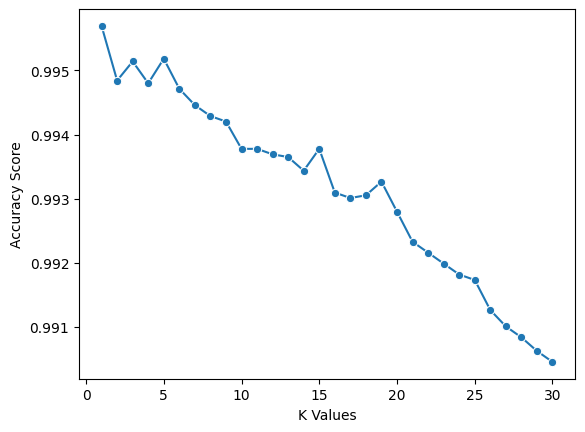

In [64]:
sns.lineplot(x = k_values, y = scores, marker = 'o')
plt.xlabel("K Values")
plt.ylabel("Accuracy Score")

We can see from our chart that k = 2,3 and 6 all have an accuracy score of almost 100%. As these are tied for the best score, it is advisable to use a smaller value for k. This is because when using higher values of k, the model will use more data points that are further away from the original.

In [94]:

# Create a KNN classifier
knn = KNeighborsClassifier()

# Define the parameter grid
param_grid = {'n_neighbors': [3, 5, 7, 9], 'weights': ['uniform', 'distance'], 'algorithm': ['ball_tree', 'kd_tree'], 'p': [1, 2]}

# Create a GridSearchCV object
clf = GridSearchCV(knn, param_grid, cv=5)

# Fit the GridSearchCV object to the training data
clf.fit(X_train, y_train)

# Print the best parameter values and the corresponding accuracy score
print("Best Parameters: ", clf.best_params_)
print("Best Accuracy: ", clf.best_score_)

Best Parameters:  {'algorithm': 'kd_tree', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best Accuracy:  0.9991836326653025


## 3. Logistic Regression

In [23]:
#fit the model on train data 
log_reg = LogisticRegression().fit(X_train, y_train)

#predict on train 
train_preds2 = log_reg.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(y_train, train_preds2))

#predict on test
test_preds2 = log_reg.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(y_test, test_preds2))
print('-'*50)

# Kappa Score.
print('KappaScore is: ', metrics.cohen_kappa_score(y_test,test_preds2))

Model accuracy on train is:  0.5418095304737247
Model accuracy on test is:  0.5443809523809524
--------------------------------------------------
KappaScore is:  0.45316931809932626


In [61]:
print("Classification Report on Test Data:\n ",classification_report(y_test,test_preds2))

Classification Report on Test Data:
                precision    recall  f1-score   support

           0       0.79      0.69      0.73      3062
           1       0.85      0.97      0.90      3084
           2       0.69      0.19      0.29      3024
           3       0.57      0.51      0.54      3103
           4       0.50      0.57      0.54      3022
           5       0.46      0.76      0.57      3080

    accuracy                           0.62     18375
   macro avg       0.64      0.61      0.60     18375
weighted avg       0.64      0.62      0.60     18375



Text(0.5, 427.9555555555555, 'Predicted label')

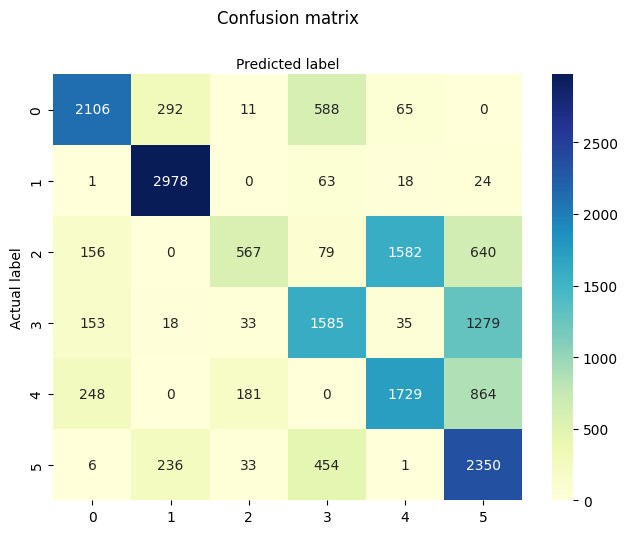

In [62]:
cnf_matrix = metrics.confusion_matrix(y_test, test_preds2)
cnf_matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')



In [63]:
cnf_matrix = metrics.confusion_matrix(y_test, test_preds2)
cnf_matrix

array([[2106,  292,   11,  588,   65,    0],
       [   1, 2978,    0,   63,   18,   24],
       [ 156,    0,  567,   79, 1582,  640],
       [ 153,   18,   33, 1585,   35, 1279],
       [ 248,    0,  181,    0, 1729,  864],
       [   6,  236,   33,  454,    1, 2350]], dtype=int64)

<AxesSubplot:xlabel='PM_Value', ylabel='AQI_Value'>

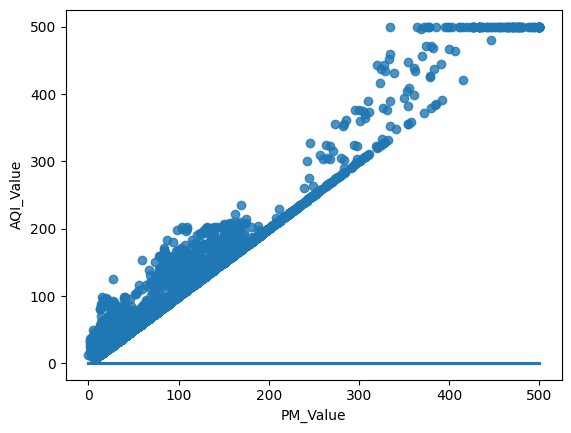

In [64]:
x=df2["PM_Value"]
y=df2["AQI_Value"]
sns.regplot(x=x, y=y, data=df2, logistic=True, ci=None)

## Grid Search useful to find Hyperparameter on Logistic Regression

In [30]:
# Create logistic regression object

# Create a list of all of the different penalty values that you want to test and save them to a variable called 'penalty'
penalty = ['l1', 'l2']
# Create a list of all of the different C values that you want to test and save them to a variable called 'C'

C = [0.0001, 0.001, 0.01, 1, 100]
# Now that you have two lists each holding the different values that you want test, use the dict() function to combine them into a dictionary. 
# Save your new dictionary to the variable 'hyperparameters'

hyperparameters = dict(C=C, penalty=penalty)

# Fit your model using gridsearch
clf = GridSearchCV(log_reg, hyperparameters, cv=5, verbose=0)

best_model = clf.fit(X_train,y_train)

#Print all the Parameters that gave the best results:
print('Best Parameters',clf.best_params_)

# You can also print the best penalty and C value individually from best_model.best_estimator_.get_params()
print('Best Penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Best C:', best_model.best_estimator_.get_params()['C'])

Best Parameters {'C': 0.01, 'penalty': 'l2'}
Best Penalty: l2
Best C: 0.01


In [103]:
log_reg.predict([[300,87,111,26,300,78,12,98,22]])

array([4])

In [104]:
log_reg.predict([[10,87,20,26,30,78,12,98,22]])

array([0])

In [105]:
log_reg.predict([[10,17,20,26,30,5,12,1,1]])

array([4])

In [72]:
from sklearn.linear_model import LogisticRegression

# Create a new Logistic Regression model with the best hyperparameters
model = LogisticRegression(C=0.01, penalty='l2')

# Train the model on the training data
model.fit(X_train, y_train)

# Evaluate the model on the test data
score = model.score(X_test, y_test)
print("Test accuracy: {:.2f}%".format(score * 100))


Test accuracy: 59.42%


## K-fold Cross Validation

In [121]:

seed = 7
kfold = model_selection.KFold(n_splits=10, random_state=None,shuffle=True)
model = LogisticRegression()
results = model_selection.cross_val_score(model, X, y, cv=kfold)
print("Accuracy: Final mean:%.3f%%, Final standard deviation:(%.3f%%)" % (results.mean()*100.0, results.std()*100.0))
print('Accuracies from each of the 5 folds using kfold:',results)
print("Variance of kfold accuracies:",results.var())

Accuracy: Final mean:99.369%, Final standard deviation:(0.168%)
Accuracies from each of the 5 folds using kfold: [0.99318279 0.99403494 0.99062633 0.99232737 0.99616368 0.9940324
 0.99232737 0.9940324  0.99658994 0.99360614]
Variance of kfold accuracies: 2.8246065529795776e-06


## 4. SVM

###  Fit SVM to the Training set

In [82]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'rbf', random_state = 0)
print("Train:",classifier.fit(X_train,y_train))

Train: SVC(random_state=0)


In [83]:
from sklearn.svm import SVC
classifier_test = SVC(kernel = 'rbf', random_state = 0)
print("Test: ",classifier_test.fit(X_test,y_test))


Test:  SVC(random_state=0)


In [84]:

params_dictionary = {
                        'C' : [0.1, 1, 10],
                        'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
                        'degree': [2,3],
                        'gamma' : [0.1,1,10] 
                    }

model = GridSearchCV(SVC(random_state=0),param_grid=params_dictionary,cv=4, n_jobs = -1, verbose = 2)

In [ ]:
model.fit(X_train,y_train)

Fitting 4 folds for each of 72 candidates, totalling 288 fits


In [86]:
model.best_params_

{'C': 1, 'degree': 2, 'gamma': 0.1, 'kernel': 'linear'}

In [87]:
model.best_score_

0.9999766747527523

### Predict the Test Set Results

In [132]:
y_pred = classifier.predict(X_test)


### Make the Confusion Matrix for large Dataset

In [133]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test,y_pred)

[[3039    0   23    0    0    0]
 [   0 3084    0    0    0    0]
 [   0    0 2975    0   49    0]
 [   0    3    0 3098    1    1]
 [   0    0    0   44 2978    0]
 [   0   20    0    0    0 3060]]


0.9923265306122449

In [129]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3062
           1       0.99      1.00      1.00      3084
           2       0.99      0.98      0.99      3024
           3       0.99      1.00      0.99      3103
           4       0.98      0.99      0.98      3022
           5       1.00      0.99      1.00      3080

    accuracy                           0.99     18375
   macro avg       0.99      0.99      0.99     18375
weighted avg       0.99      0.99      0.99     18375



### Visualise the Test set results

training set score: 0.966552
test set score: 0.964245
training set score: 0.958412
test set score: 0.955211
training set score: 0.961701
test set score: 0.958639
0.8514682691897881


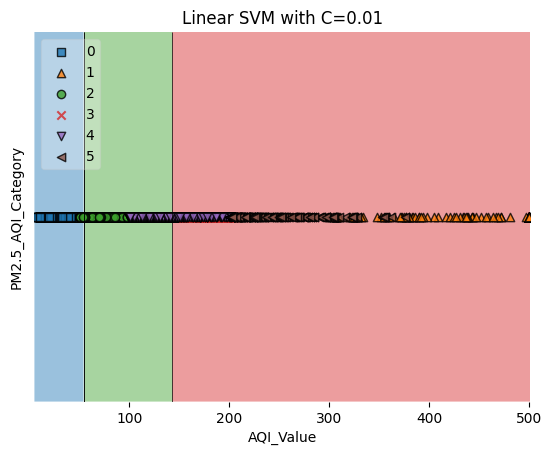

In [156]:
from mlxtend.plotting import plot_decision_regions
import matplotlib.pyplot as plt

# Fit a linear SVM model with default C value
LinearSVM = LinearSVC().fit(X_train,y_train)

# C=100
LinearSVM100 = LinearSVC(C=100).fit(X_train,y_train)
print("training set score: %f" % LinearSVM100.score(X_train,y_train))
print("test set score: %f" % LinearSVM100.score(X_test,y_test))
print("training set score: %f" % LinearSVM.score(X_train,y_train))
print("test set score: %f" % LinearSVM.score(X_test,y_test))

# C=0.01
LinearSVM001 = LinearSVC(C=0.01).fit(X_train,y_train)
print("training set score: %f" % LinearSVM001.score(X_train,y_train))
print("test set score: %f" % LinearSVM001.score(X_test,y_test))

def LinearSVM_comparison(df2,c):
    x = df2[['AQI_Value']].values
    y = df2['PM2.5_AQI_Category'].astype(int).values

    LinearSVM_plot = LinearSVC(C=c)
    LinearSVM_plot.fit(x,y)
    print(LinearSVM_plot.score(x,y))
    # Plot decision region:
    plot_decision_regions(x,y, clf=LinearSVM_plot, legend=2)
    # Adding axes annotations:
    plt.xlabel('AQI_Value')
    plt.ylabel('PM2.5_AQI_Category')
    plt.title('Linear SVM with C='+str(c))
    plt.show()

LinearSVM_comparison(df2,0.01)


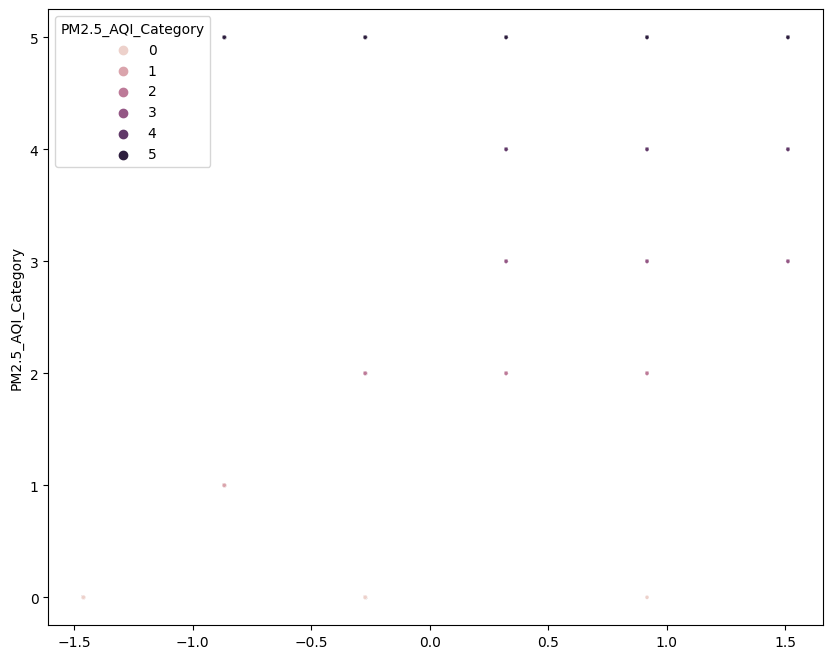

In [150]:
svc_model = SVC(kernel='linear', random_state=32, C=1e9, gamma='scale')
svc_model.fit(X_train, y_train)
plt.figure(figsize=(10, 8))
# Plotting our two-features-space
sns.scatterplot(x=X_train[:, 0], 
                y=y_train, 
                hue=y_train, 
                s=8);
# Constructing a hyperplane using a formula.
w = svc_model.coef_[0]           # w consists of 2 elements
b = svc_model.intercept_[0]      # b consists of 1 element
x_points = np.linspace(-1, 1)    # generating x-points from -1 to 1
y_points = -(w[0] / w[1]) * x_points - b / w[1]  # getting corresponding y-points

# Plotting a red hyperplane
plt.plot(x_points, y_points, c='r');



In [162]:
from sklearn.svm import SVC

svm = SVC(kernel='rbf', random_state=0, gamma=.10, C=1.0)
svm.fit(X_train_std_,y_train)

print('The accuracy of the svm classifier on training data is {:.2f} out of 1'.format(svm.score(X_train_std_, y_train)))

print('The accuracy of the svm classifier on test data is {:.2f} out of 1'.format(svm.score(X_test_std_, y_test)))

The accuracy of the svm classifier on training data is 0.99 out of 1
The accuracy of the svm classifier on test data is 0.99 out of 1


## 5. Random Forest

In [21]:
#fit the model on train data
RF = RandomForestClassifier().fit(X_train, y_train)


print("For Test Data")
RF_test_pred = RF.predict(X_test)

from sklearn.metrics import confusion_matrix, accuracy_score

display(pd.crosstab(y_test, RF_test_pred, rownames=["Actual"], colnames=["Prediction"]))
display(accuracy_score(RF_test_pred, y_test))

print()
print("For Train Data")
RF_train_pred = RF.predict(X_train)

from sklearn.metrics import confusion_matrix, accuracy_score

display(pd.crosstab(y_train, RF_train_pred, rownames=["Actual"], colnames=["Prediction"]))
print(accuracy_score(RF_train_pred, y_train))

For Test Data


Prediction,0,1,2,3,4,5
Actual,,,,,,
0,3062,0,0,0,0,0
1,0,3084,0,0,0,0
2,0,0,3024,0,0,0
3,0,0,0,3103,0,0
4,0,0,0,0,3022,0
5,0,0,0,0,0,3080


1.0


For Train Data


Prediction,0,1,2,3,4,5
Actual,,,,,,
0,7146,0,0,0,0,0
1,0,7124,0,0,0,0
2,0,0,7184,0,0,0
3,0,0,0,7105,0,0
4,0,0,0,0,7186,0
5,0,0,0,0,0,7128


1.0


In [174]:

param_grid = {'n_estimators': [2, 3, 4],
              'criterion': ['gini', 'entropy'],
              'verbose': [0, 4, 10],
              'warm_start': [False, True],
              'random_state': [42, 72, 100, 200]}


In [22]:
from sklearn.ensemble import RandomForestClassifier

# Generate a toy dataset
#X1, y1 = make_classification(n_samples=1000, n_features=10, n_informative=5, n_classes=2, random_state=42)

# Define the parameter grid to search over

param_grid = {'n_estimators': [2, 3, 4],
              'criterion': ['gini', 'entropy'],
              'verbose': [0, 4, 10],
              'warm_start': [False, True],
              'random_state': [42, 72, 100, 200]}
# Create a random forest classifier object
rfc = RandomForestClassifier()

# Perform grid search with cross-validation
grid_search = GridSearchCV(rfc, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X, y)

# Print the best parameters and score
print("Best Parameters: ", grid_search.best_params_)
print("Best Score: ", grid_search.best_score_)


Best Parameters:  {'criterion': 'entropy', 'n_estimators': 3, 'random_state': 200, 'verbose': 0, 'warm_start': False}
Best Score:  0.999872140927819


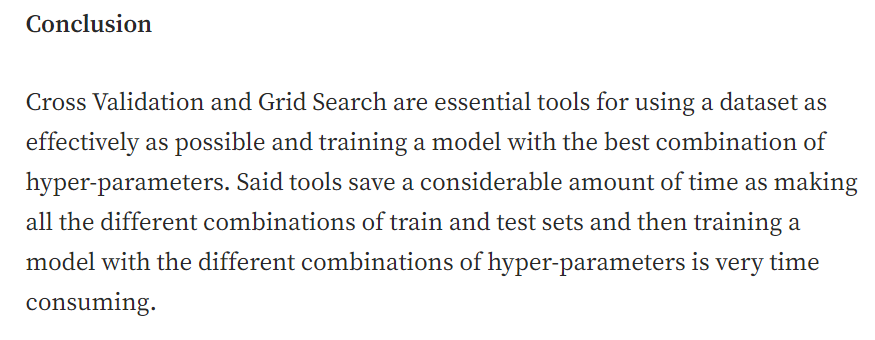

# Gradient Descent

In [81]:
import numpy as np

# Define the sigmoid function
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# Define the cost function
def compute_cost(X, y, theta):
    m = len(y)
    h = sigmoid(X @ theta)
    cost = -1 / m * (y.T @ np.log(h) + (1 - y).T @ np.log(1 - h))
    return cost

# Define the gradient function
def gradient_descent(X, y, theta, alpha, iterations):
    m = len(y)
    J_history = np.zeros((iterations, 1))
    for i in range(iterations):
        h = sigmoid(X @ theta)
        gradient = 1 / m * X.T @ (h - y)
        theta = theta - alpha * gradient
        J_history[i] = compute_cost(X, y, theta)
    return theta, J_history

# Load the dataset
from sklearn.datasets import make_classification

X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                             random_state=1, n_clusters_per_class=1)

# Add intercept term to X
X = np.concatenate([np.ones((len(X), 1)), X], axis=1)

# Initialize theta to zeros
theta = np.zeros((X.shape[1], 1))

# Set hyperparameters
alpha = 0.1
iterations = 1000

# Perform gradient descent
theta, J_history = gradient_descent(X, y.reshape(-1, 1), theta, alpha, iterations)

# Print the final parameters and the cost history
print("Final Parameters: ", theta)
print("Final Cost: ", J_history[-1])


Final Parameters:  [[-0.01149581]
 [-4.63545974]
 [ 0.08144466]]
Final Cost:  [0.01478125]


# XGBoost

In [37]:

# create an XGBoost classifier
classifier = xgb.XGBClassifier()

# train the classifier on the training set
classifier.fit(X_train, y_train)

# make predictions on the testing set
predictions = classifier.predict(X_test)

# evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [53]:
gbc=XGBClassifier(learning_rate =0.01,n_estimators=100,max_depth=1, min_child_weight=6,subsample=0.8,seed=13)
gbc.fit(X_train,y_train)
pred = gbc.predict(X_test)
xgb_conf_matrix = confusion_matrix(y_test, pred)
accuracy = accuracy_score(y_test, pred)*100
print("Confussion Matrix:")
print(xgb_conf_matrix)
print("\n")
print("XGBoost Accuracy:",(accuracy/100))

Confussion Matrix:
[[3062    0    0    0    0    0]
 [   0 3084    0    0    0    0]
 [   0    0 2992    0   32    0]
 [   0    0    0 3041    4   58]
 [   0    0    0  224 2780   18]
 [   0    0    0  233   14 2833]]


XGBoost Accuracy: 0.9682721088435374


In [47]:


# Define the XGBoost model
params = {
    'objective': 'multi:softmax',
    'num_class': 6,
    'max_depth': 6,
    'eta': 0.3,
    'subsample': 0.8,
    'colsample_bytree': 0.8
}

# Convert data to DMatrix format
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Train the model
model = xgb.train(params, dtrain=dtrain, num_boost_round=1000, early_stopping_rounds=10, evals=[(dtest, 'test')])

# Make predictions
y_pred = model.predict(dtest)

# Evaluate the model
accuracy = np.sum(y_pred == y_test) / len(y_test)
print(f'Accuracy: {accuracy}')


[0]	test-mlogloss:1.01106
[1]	test-mlogloss:0.68098
[2]	test-mlogloss:0.48131
[3]	test-mlogloss:0.34718
[4]	test-mlogloss:0.25214
[5]	test-mlogloss:0.18478
[6]	test-mlogloss:0.13552
[7]	test-mlogloss:0.09984
[8]	test-mlogloss:0.07397
[9]	test-mlogloss:0.05463
[10]	test-mlogloss:0.04039
[11]	test-mlogloss:0.03003
[12]	test-mlogloss:0.02242
[13]	test-mlogloss:0.01671
[14]	test-mlogloss:0.01243
[15]	test-mlogloss:0.00932
[16]	test-mlogloss:0.00696
[17]	test-mlogloss:0.00523
[18]	test-mlogloss:0.00396
[19]	test-mlogloss:0.00299
[20]	test-mlogloss:0.00225
[21]	test-mlogloss:0.00169
[22]	test-mlogloss:0.00130
[23]	test-mlogloss:0.00100
[24]	test-mlogloss:0.00077
[25]	test-mlogloss:0.00061
[26]	test-mlogloss:0.00048
[27]	test-mlogloss:0.00039
[28]	test-mlogloss:0.00031
[29]	test-mlogloss:0.00026
[30]	test-mlogloss:0.00021
[31]	test-mlogloss:0.00018
[32]	test-mlogloss:0.00015
[33]	test-mlogloss:0.00013
[34]	test-mlogloss:0.00012
[35]	test-mlogloss:0.00011
[36]	test-mlogloss:0.00011
[37]	test-m

In [ ]:


# Define the hyperparameters to tune
params = {'max_depth': [3, 5, 7],
          'learning_rate': [0.1, 0.01, 0.001],
          'n_estimators': [50, 100, 200]}

# Create an XGBoost classifier
xgb_model = xgb.XGBClassifier()

# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=xgb_model, param_grid=params, cv=5)

# Fit the GridSearchCV object to the data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print(grid_search.best_params_)
